<a href="https://colab.research.google.com/github/tanupat92/cs2756_project/blob/main/EDA_DimensionalityReduction_mining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import sklearn.model_selection
import sklearn.linear_model
import seaborn as sns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
#import the data
train= pd.read_csv('/content/drive/MyDrive/Datamining/train.csv')
# Only for the competition on kaggle the following import not for our project the test set does not contain sale price


In [5]:
train.shape

(1460, 81)

In [6]:
train.isna().sum().sort_values(ascending=False).head(20)

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageYrBlt       81
GarageCond        81
GarageType        81
GarageFinish      81
GarageQual        81
BsmtFinType2      38
BsmtExposure      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrArea         8
MasVnrType         8
Electrical         1
Id                 0
dtype: int64

In [7]:
len(train.columns)

81

In [8]:
200/ train.shape[0]

0.136986301369863

In [9]:
for feature in train.columns:
    if train[feature].isna().sum() > 200:
        print("Dropped Feature is ",feature)
        train=train.drop(feature,axis=1)

Dropped Feature is  LotFrontage
Dropped Feature is  Alley
Dropped Feature is  FireplaceQu
Dropped Feature is  PoolQC
Dropped Feature is  Fence
Dropped Feature is  MiscFeature


In [10]:
train.select_dtypes(np.number).hist(bins = 50,figsize =(30,20));

Error in callback <function flush_figures at 0x7f3a972b8e60> (for post_execute):


KeyboardInterrupt: ignored

In [11]:
def plot_corr(df,size=10):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    cax = ax.matshow(corr, cmap='RdYlGn')
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90);
    plt.yticks(range(len(corr.columns)), corr.columns);
    cbar = fig.colorbar(cax, ticks=[-1, 0, 1], aspect=40, shrink=.8)

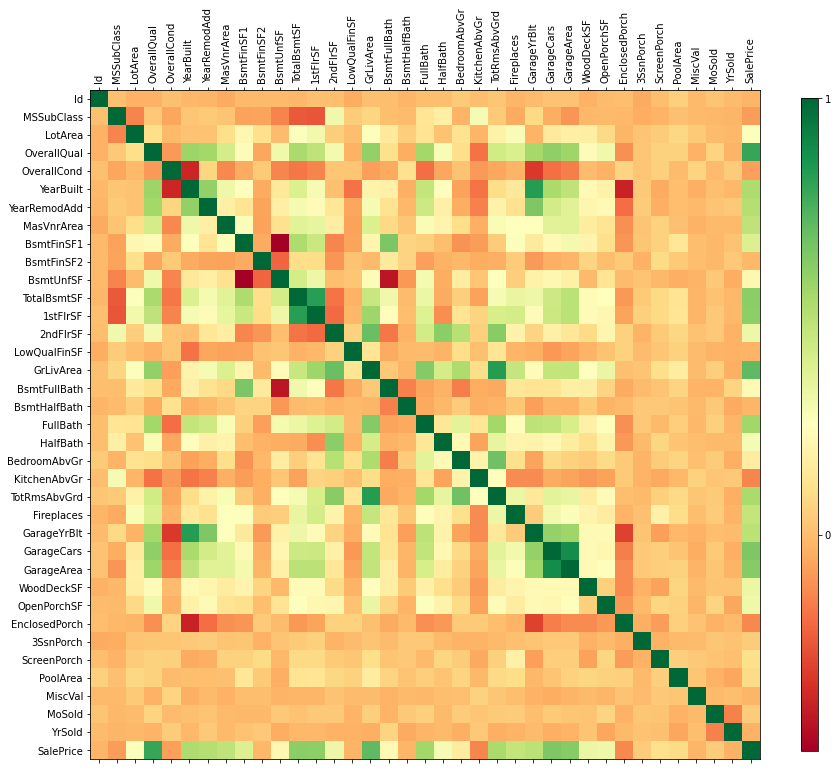

In [12]:
plot_corr(train,15)

In [13]:
from scipy.stats import pearsonr
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale
from sklearn.pipeline import make_pipeline
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from numpy import random
import seaborn as sns

In [14]:
attr_one_hot=['Foundation','Condition2','Exterior2nd','MSSubClass','MSZoning','Street','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','BldgType','RoofStyle','RoofMatl','Exterior1st','Heating','CentralAir','Electrical','Functional','GarageType','GarageFinish','GarageCond','PavedDrive','SaleType','SaleCondition','MasVnrType','BsmtExposure','BsmtFinType1','GarageQual','BsmtFinType2','HouseStyle']
ohe=sklearn.preprocessing.OneHotEncoder(sparse=False) 
ohe.fit(train[attr_one_hot])
categorical_Ohe=ohe.transform(train[attr_one_hot])
categorical_Ohe=pd.DataFrame(categorical_Ohe,columns=ohe.get_feature_names())

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [15]:
len(attr_one_hot)

33

In [16]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

mm = MinMaxScaler()
# SCALE MAPPING
attr_scale_mapped=['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual']
scale_mapper = {'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'NA':0,'NaN':0}
for feature in attr_scale_mapped:
    train[feature] =train[feature].replace(scale_mapper)
train_attr_scale = pd.DataFrame(mm.fit_transform(train[attr_scale_mapped]), columns = attr_scale_mapped)

In [17]:
len(attr_scale_mapped)

6

In [18]:
cont_attr = set(train.columns) - set(attr_one_hot) - set(attr_scale_mapped) - set("Saleprice")

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f3a75f35450>,
      dtype=object)

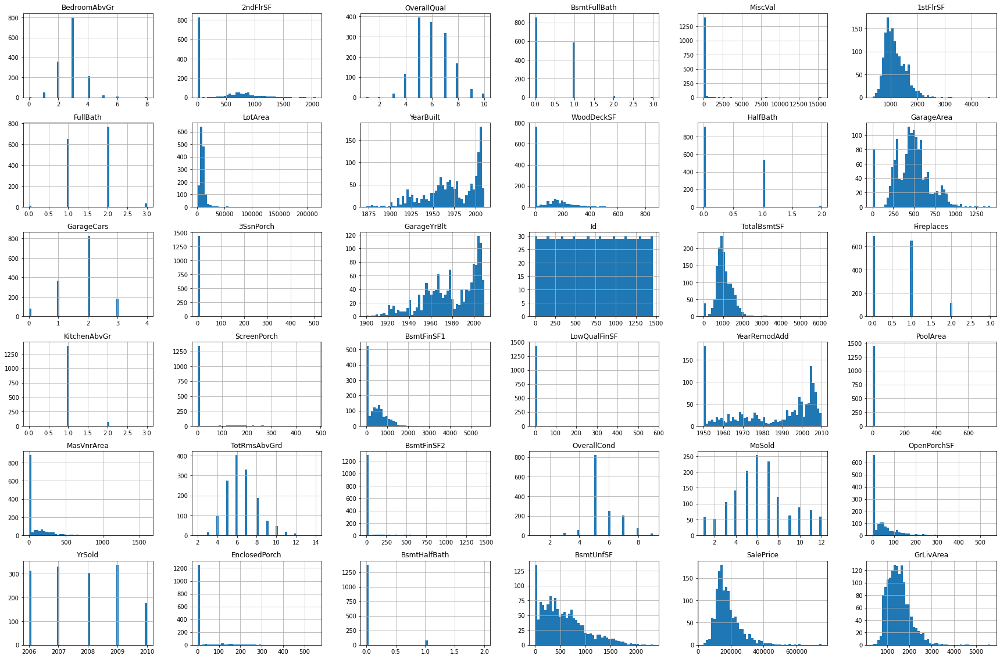

In [19]:
train.loc[:, cont_attr].select_dtypes(np.number).hist(bins = 50,figsize =(30,20))

In [17]:
len(cont_attr)

36

In [18]:
train.shape

(1460, 75)

In [19]:
train_cont_mm = mm.fit_transform(train[cont_attr])
train_cont_mm = pd.DataFrame(train_cont_mm, columns=train[cont_attr].columns)

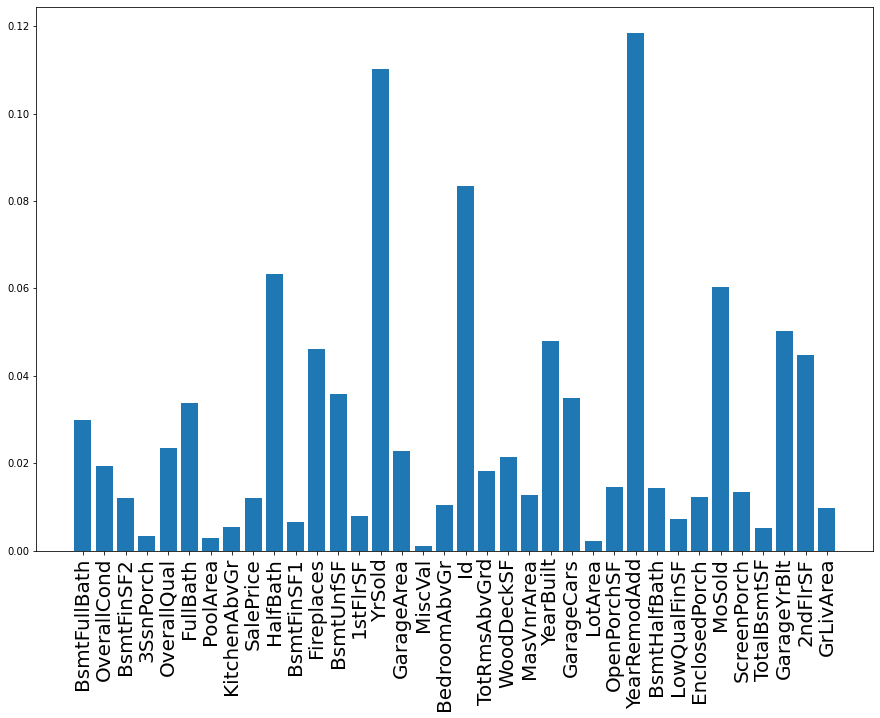

In [20]:
def plot_variance(df, mask=None):
    plt.figure(figsize=(15,10))
    try:
        plt.bar(height=df.var(axis=0), x = train[cont_attr].loc[:,mask].var(axis=0).index)
    except:
        plt.bar(height=df.var(axis=0), x = train[cont_attr].var(axis=0).index)
    plt.xticks(rotation = 90, fontsize=20)
    plt.show()
plot_variance(train_cont_mm)

In [21]:
from sklearn.feature_selection import VarianceThreshold

vt = VarianceThreshold(threshold =0.01)

In [22]:
vt.fit(train_cont_mm)
mask = vt.get_support()
train_cont_reduced = train_cont_mm.loc[:, mask]

In [23]:
train[cont_attr].loc[:,mask].var(axis=0).index.shape

(26,)

In [24]:
train[cont_attr].loc[:, np.invert(mask)].columns

Index(['3SsnPorch', 'PoolArea', 'KitchenAbvGr', 'BsmtFinSF1', '1stFlrSF',
       'MiscVal', 'LotArea', 'LowQualFinSF', 'TotalBsmtSF', 'GrLivArea'],
      dtype='object')

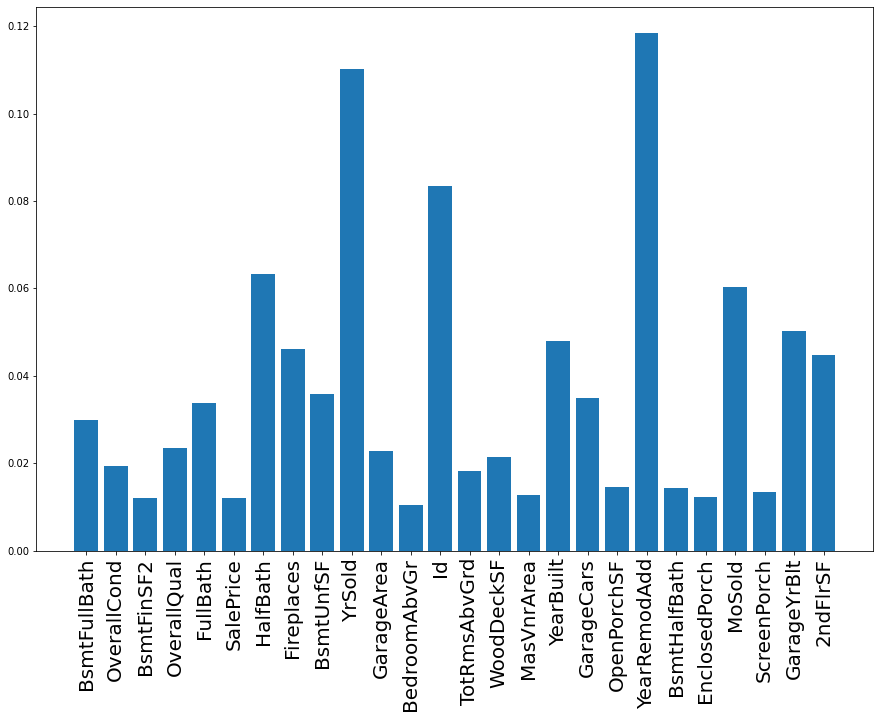

In [25]:
plot_variance(train_cont_reduced, mask)

In [26]:
train_cont_reduced

,BsmtFullBath,OverallCond,BsmtFinSF2,OverallQual,FullBath,SalePrice,HalfBath,Fireplaces,BsmtUnfSF,YrSold,GarageArea,BedroomAbvGr,Id,TotRmsAbvGrd,WoodDeckSF,MasVnrArea,YearBuilt,GarageCars,OpenPorchSF,YearRemodAdd,BsmtHalfBath,EnclosedPorch,MoSold,ScreenPorch,GarageYrBlt,2ndFlrSF
0,0.333333,0.500,0.000000,0.666667,0.666667,0.241078,0.5,0.000000,0.064212,0.50,0.386460,0.375,0.000000,0.500000,0.000000,0.122500,0.949275,0.50,0.111517,0.883333,0.0,0.000000,0.090909,0.000000,0.936364,0.413559
1,0.000000,0.875,0.000000,0.555556,0.666667,0.203583,0.0,0.333333,0.121575,0.25,0.324401,0.375,0.000685,0.333333,0.347725,0.000000,0.753623,0.50,0.000000,0.433333,0.5,0.000000,0.363636,0.000000,0.690909,0.000000
2,0.333333,0.500,0.000000,0.666667,0.666667,0.261908,0.5,0.333333,0.185788,0.50,0.428773,0.375,0.001371,0.333333,0.000000,0.101250,0.934783,0.50,0.076782,0.866667,0.0,0.000000,0.727273,0.000000,0.918182,0.419370
3,0.333333,0.500,0.000000,0.666667,0.333333,0.145952,0.0,0.333333,0.231164,0.00,0.452750,0.375,0.002056,0.416667,0.000000,0.000000,0.311594,0.75,0.063985,0.333333,0.0,0.492754,0.090909,0.000000,0.890909,0.366102
4,0.333333,0.500,0.000000,0.777778,0.666667,0.298709,0.5,0.333333,0.209760,0.50,0.589563,0.500,0.002742,0.583333,0.224037,0.218750,0.927536,0.75,0.153565,0.833333,0.0,0.000000,1.000000,0.000000,0.909091,0.509927
5,0.333333,0.500,0.000000,0.444444,0.333333,0.150118,0.5,0.000000,0.027397,0.75,0.338505,0.125,0.003427,0.250000,0.046674,0.000000,0.876812,0.50,0.054845,0.750000,0.0,0.000000,0.818182,0.000000,0.845455,0.274092
6,0.333333,0.500,0.000000,0.777778,0.666667,0.377864,0.0,0.333333,0.135702,0.25,0.448519,0.375,0.004112,0.416667,0.297550,0.116250,0.956522,0.50,0.104205,0.916667,0.0,0.000000,0.636364,0.000000,0.945455,0.000000
7,0.333333,0.625,0.021710,0.666667,0.666667,0.229274,0.5,0.666667,0.092466,0.75,0.341326,0.375,0.004798,0.416667,0.274212,0.150000,0.731884,0.50,0.372943,0.383333,0.0,0.413043,0.909091,0.000000,0.663636,0.476029
8,0.000000,0.500,0.000000,0.666667,0.666667,0.131926,0.0,0.666667,0.407534,0.50,0.330042,0.250,0.005483,0.500000,0.105018,0.000000,0.427536,0.50,0.000000,0.000000,0.0,0.371377,0.272727,0.000000,0.281818,0.364165
9,0.333333,0.625,0.000000,0.444444,0.333333,0.115401,0.0,0.666667,0.059932,0.50,0.144570,0.250,0.006169,0.250000,0.000000,0.000000,0.485507,0.25,0.007313,0.000000,0.0,0.000000,0.000000,0.000000,0.354545,0.000000


In [27]:
full_df = pd.concat([train_cont_reduced , train_attr_scale, categorical_Ohe ], axis=1).drop(columns='Id')

In [28]:
(full_df.isna().sum(axis=1)>0).sum()

119

In [29]:
full_df.isna().sum(axis=0)[(full_df.isna().sum(axis=0)>0)]

MasVnrArea      8
GarageYrBlt    81
BsmtQual       37
BsmtCond       37
dtype: int64

In [30]:
#!pip install scikit-learn==1.0.2

In [31]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imp = IterativeImputer(max_iter=10, random_state=0)
full_df_imputed = imp.fit_transform(full_df)

[ 5.   16.25 27.5  38.75 50.  ]
[ 100  177  316  562 1000]
(5, 5)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


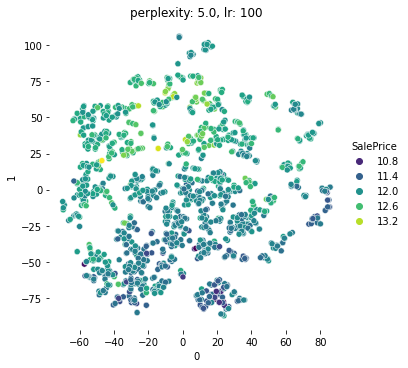

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


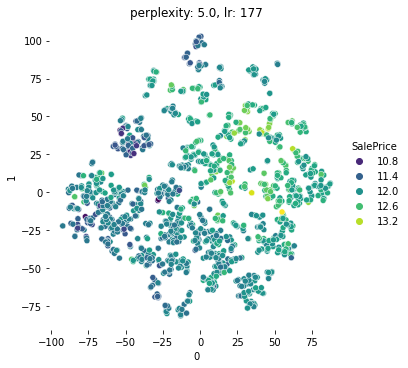

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


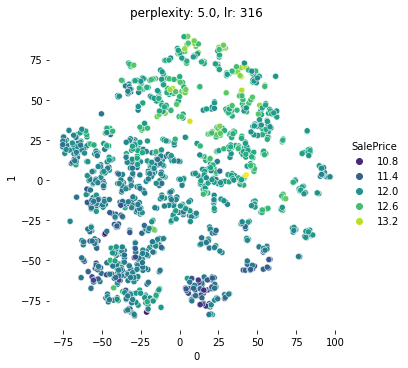

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


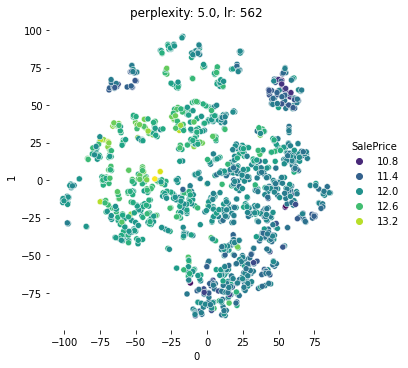

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


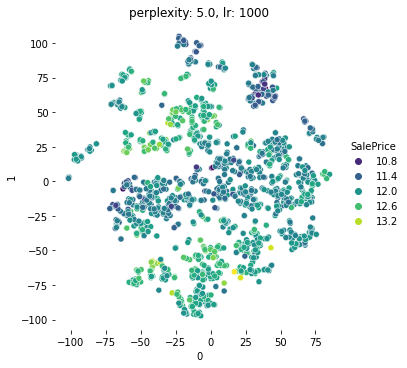

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


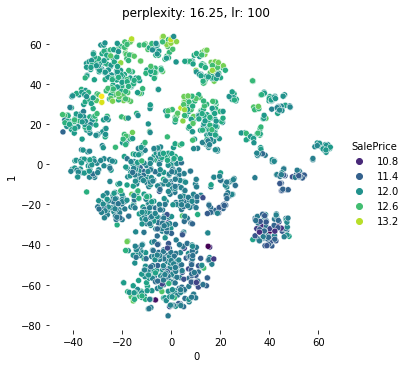

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


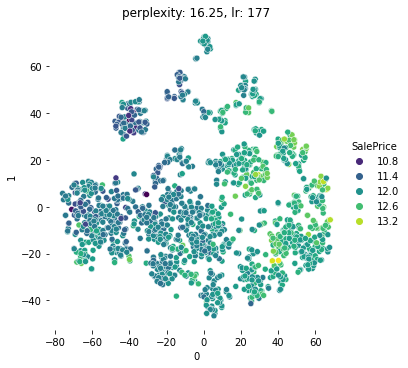

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


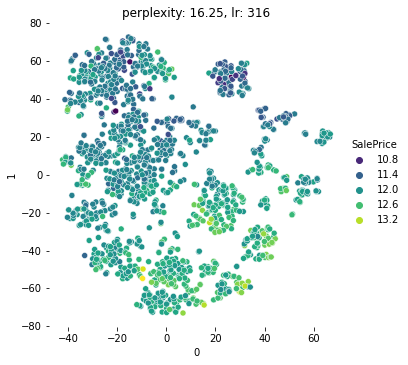

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


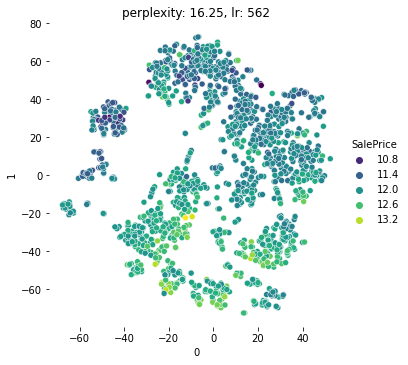

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


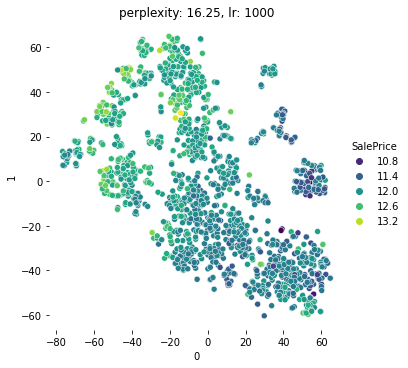

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


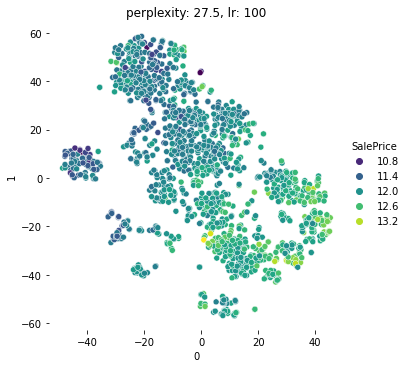

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


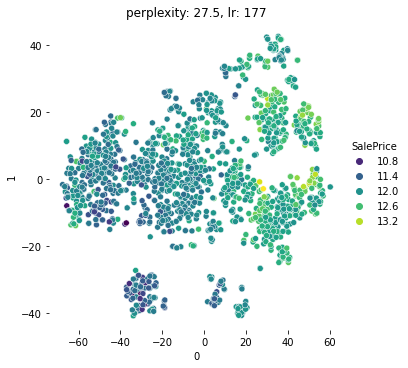

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


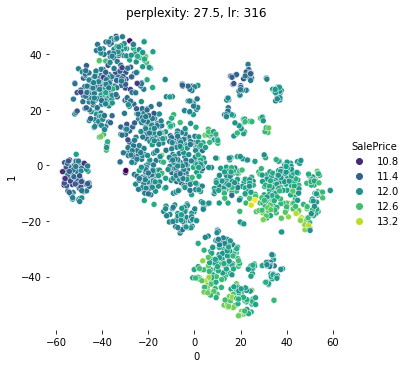

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


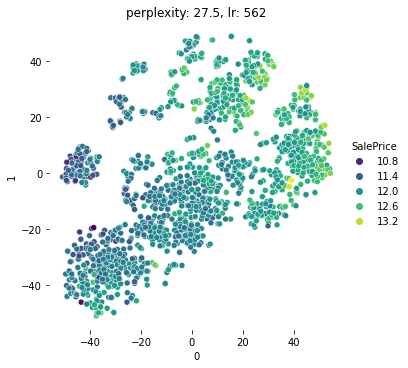

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


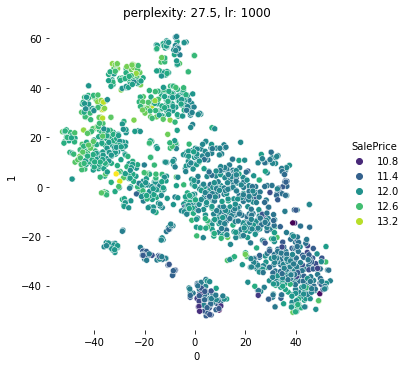

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


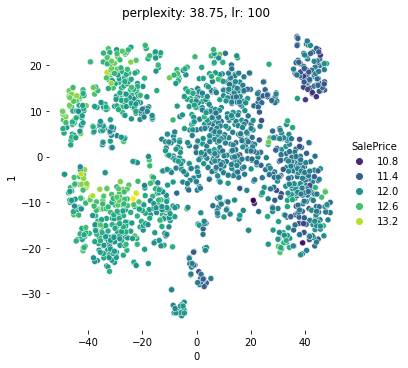

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


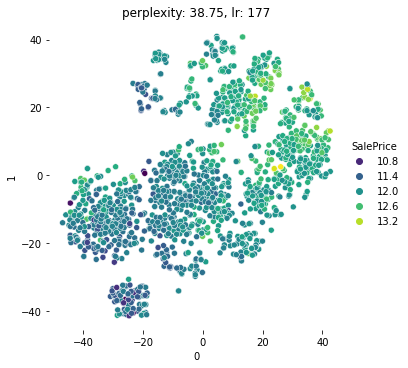

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


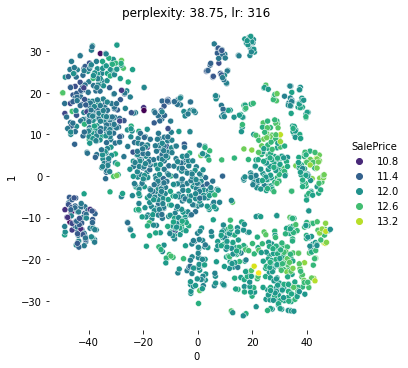

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


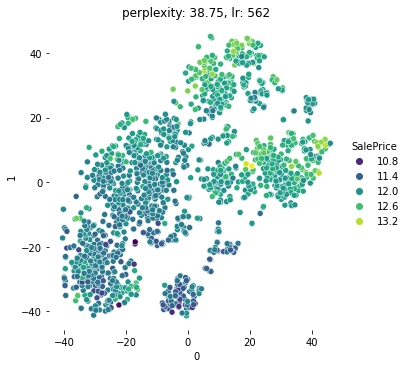

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


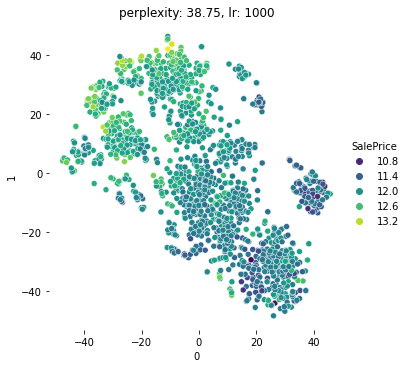

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


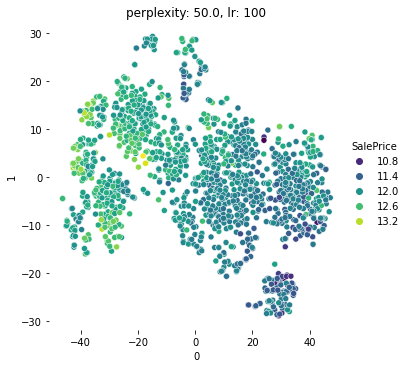

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


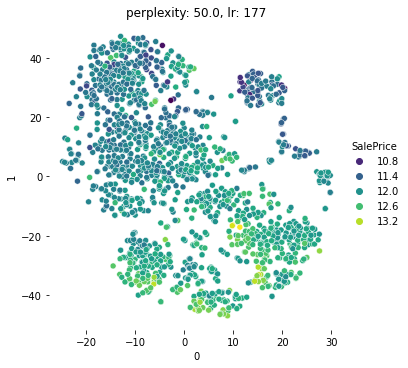

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


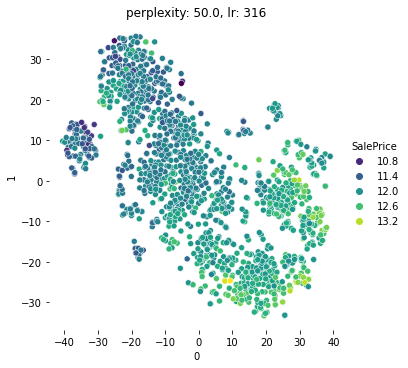

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


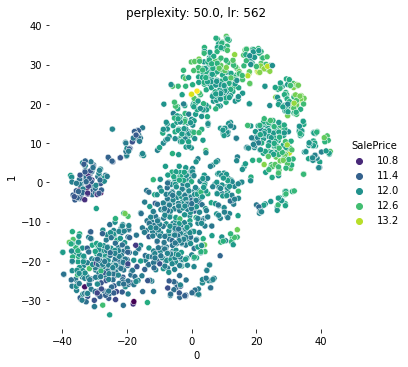

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


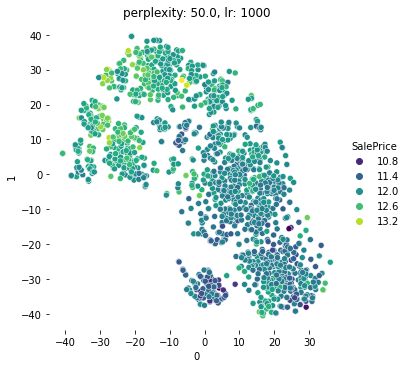

In [ ]:
perplexity_range = np.linspace(5,50,5)
print(perplexity_range)
learning_rate_range = np.logspace(2,3,5).astype(int)
print(learning_rate_range)
num_plots = (len(perplexity_range), len(learning_rate_range))
print(num_plots)
sp = np.log(train['SalePrice'])
tsne_figs =[]
for i in range(len(perplexity_range)):
  for j in range(len(learning_rate_range)):
    pp = perplexity_range[i]
    lr = learning_rate_range[j]
    tsne_features = TSNE(perplexity=pp, learning_rate=lr, random_state=42).fit_transform(full_df_imputed)
    tsne_df = pd.concat([pd.DataFrame(tsne_features), sp], axis=1)
    
    cmap = sns.color_palette("viridis", as_cmap=True)
    g = sns.relplot(
        data=tsne_df,
        x=0, y=1,
        hue="SalePrice",
        palette=cmap, sizes=(10, 200),
    )
    g.ax.xaxis.grid(True, "minor", linewidth=.25)
    g.ax.yaxis.grid(True, "minor", linewidth=.25)
    g.despine(left=True, bottom=True)
    plt.title('perplexity: {}, lr: {}'.format(pp, lr))
    tsne_figs.append(g)
    plt.show()
    

(array([  5.,  12.,  54., 184., 470., 400., 220.,  90.,  19.,   6.]),
 array([10.46024211, 10.7676652 , 11.07508829, 11.38251138, 11.68993448,
        11.99735757, 12.30478066, 12.61220375, 12.91962684, 13.22704994,
        13.53447303]),
 <a list of 10 Patch objects>)

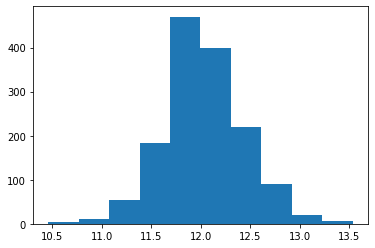

In [32]:
plt.hist(np.log(train['SalePrice']))

In [33]:
pc = PCA()
pc.fit(full_df_imputed)

PCA()

41


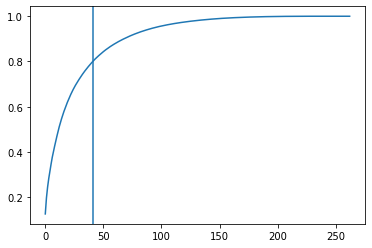

In [34]:
explained_percentage= 0.8
plt.plot(np.cumsum(pc.explained_variance_ratio_))
ind = np.sum(np.cumsum(pc.explained_variance_ratio_) <= explained_percentage)
print(ind)
plt.axvline(x=ind)

In [35]:
pc_array = pc.transform(full_df_imputed)
sp = np.log(train['SalePrice'])
pc_df = pd.concat([pd.DataFrame(pc_array[:,:2]), sp], axis=1)

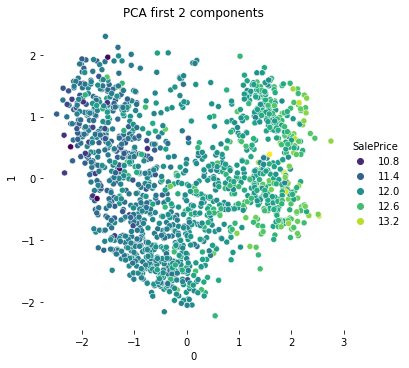

In [36]:
cmap = sns.color_palette("viridis", as_cmap=True)
g = sns.relplot(
    data=pc_df,
    x=0, y=1,
    hue="SalePrice",
    palette=cmap, sizes=(10, 200),
)
g.ax.xaxis.grid(True, "minor", linewidth=.25)
g.ax.yaxis.grid(True, "minor", linewidth=.25)
g.despine(left=True, bottom=True)
plt.title('PCA first 2 components')
plt.show()

# Clustering

In [37]:
def silhouette_scores(features, method, n_clusters_range=16, params={'metric':'euclidean', 'method':'average'}):
  silhouette = []
  for i in range(1, n_clusters_range):
    if method =='kmeans':
      labels = kmeans_label(features, i+1)
    elif method =='hierarchy':
      labels = hierarchy_label(features, i+1, method=params['method'], metric=params['metric'])
    score = silhouette_score(features, labels)
    silhouette.append(score)
  return silhouette

def elbow_plot(features, method, n_clusters_range=16):
  inertias = []
  for i in range(1,n_clusters_range):
    if method =='kmeans':
      kmean_model = KMeans(n_clusters=i, random_state=42, max_iter=500)
      kmean_model.fit(features)
      labels = kmean_model.predict(features)
      inertias.append(kmean_model.inertia_)
    elif method=='hierarchy': 
      continue
  return plt.plot(range(1,n_clusters_range), inertias, '-o')

def visualize_tsne(dist_mat, hue=None, lr=200, pp=30, random_state=42, n_components=2):
  model = TSNE(n_components= n_components, learning_rate=lr, perplexity=pp, random_state=42)
  tsne_features = model.fit_transform(dist_mat)
  if hue is None:
    df = pd.DataFrame({'xs':tsne_features[:,0], 'ys':tsne_features[:,1]})
    return sns.scatterplot(x='xs', y='ys', data = df)
  else:
    df = pd.DataFrame({'xs':tsne_features[:,0], 'ys':tsne_features[:,1], 'status':hue})
    return sns.scatterplot(x='xs', y='ys', hue='status', data = df)

def kmeans_label(data, n_clusters):
  return KMeans(n_clusters=n_clusters, max_iter=500, random_state=42).fit_predict(data)
 
def hierarchy_label(data, n_clusters, method='average', metric='euclidean'):
  mat = linkage(data, method=method, metric=metric)
  return fcluster(mat, n_clusters, criterion='maxclust')

def dbscan_label(data, eps, min_samples):
  return DBSCAN(eps=eps,min_samples=min_samples).fit_predict(data)

def Dendrogram(data, labels=None):
  mergings = linkage(data, method = 'average')
  if labels is None:
    dendrogram(mergings)
  else:
    dendrogram(mergings,
           labels =labels,
           leaf_rotation =90,
           leaf_font_size=3)
  return None
    
def crosstab(y_known, y_predict, table_type=['absolute','relative']):
  if table_type=='absolute':
    return pd.crosstab(y_known, y_predict)
  elif table_type=='relative':
    return pd.crosstab(y_known, y_predict).apply(lambda r: round(r*100/ r.sum(), 2), axis=0)

def tsne_features(data, learning_rate=316, perplexity=50, n_components=2, random_state=42):
  model = TSNE(learning_rate=learning_rate, perplexity=perplexity, random_state=random_state, n_components=n_components)
  return model.fit_transform(data)


In [38]:
tsne_features = TSNE(n_components=2,perplexity=38.75, learning_rate=1000,n_jobs=-1, random_state=42).fit_transform(full_df_imputed)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


In [39]:
db_label = dbscan_label(full_df_imputed, eps=0.5, min_samples=2)

In [40]:
tsne_df = pd.concat([pd.DataFrame(tsne_features), pd.DataFrame(db_label)], axis=1)

In [41]:
def plot_tsne_cluster(label):
    tsne_df = pd.concat([pd.DataFrame(tsne_features), pd.DataFrame(label)], axis=1)
    tsne_df.columns = [0,1,2]
    g = sns.relplot(
        data=tsne_df,
        x=0, y=1,
        hue=2,
        palette= sns.color_palette("hls", np.size(np.unique(label))),
        sizes=(10, 200),
    )
    g.ax.xaxis.grid(True, "minor", linewidth=.25)
    g.ax.yaxis.grid(True, "minor", linewidth=.25)
    g.despine(left=True, bottom=True)
    plt.show()

    

2.7 3.0 0.23216523690989577


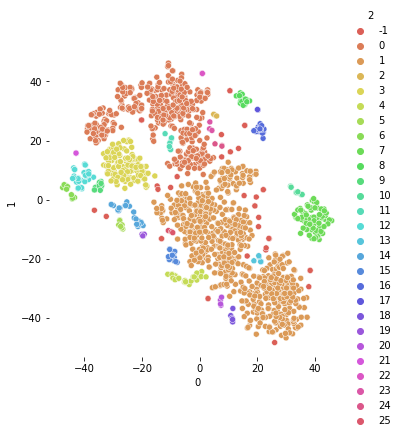

2.7 4.75 0.2009684866154237


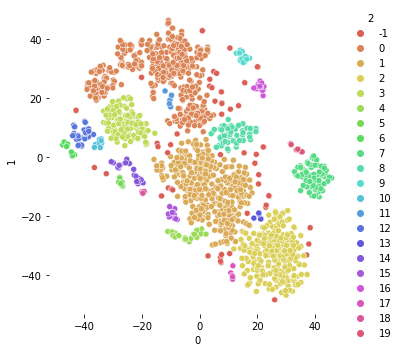

2.7 6.5 0.17932567456992682


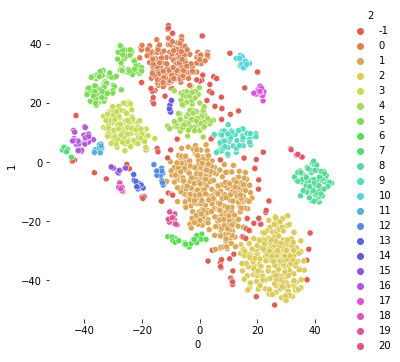

2.7 8.25 0.16633852703555166


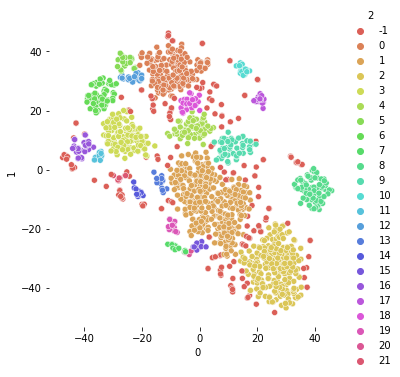

2.7 10.0 0.1717210365160633


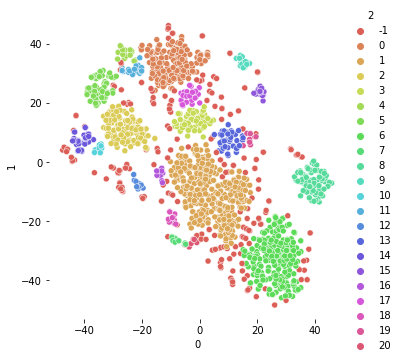

3.0250000000000004 3.0 0.26957096461561997


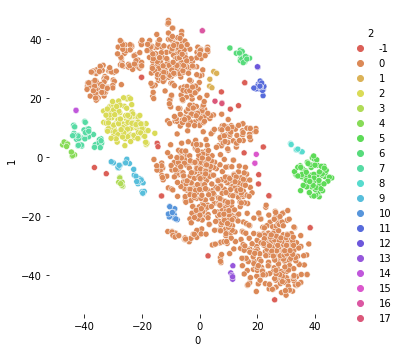

3.0250000000000004 4.75 0.2953023116457912


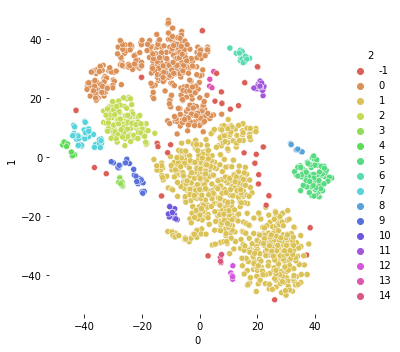

3.0250000000000004 6.5 0.27196890914295196


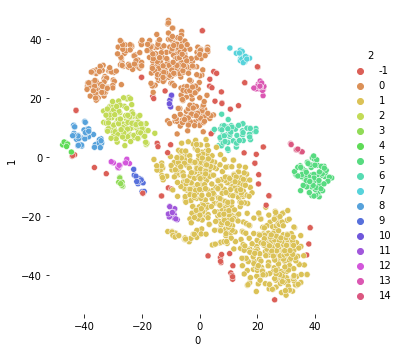

3.0250000000000004 8.25 0.21350048397013044


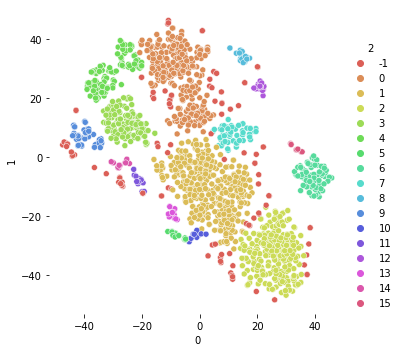

3.0250000000000004 10.0 0.18973395297723827


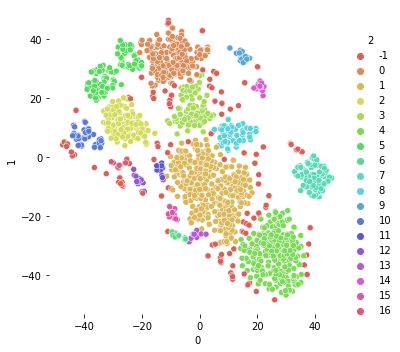

3.35 3.0 0.3040877590831281


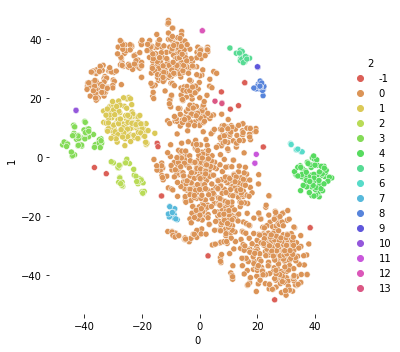

3.35 4.75 0.33704787397249536


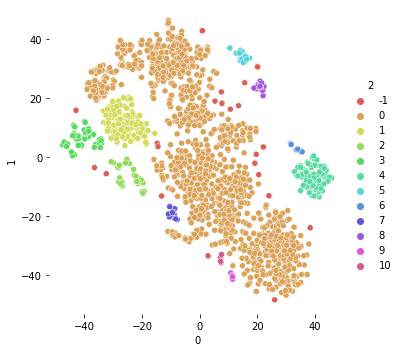

3.35 6.5 0.3451532720413934


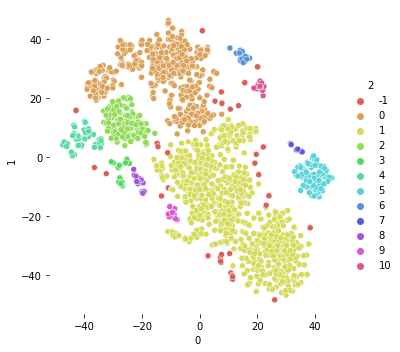

3.35 8.25 0.3406894389241211


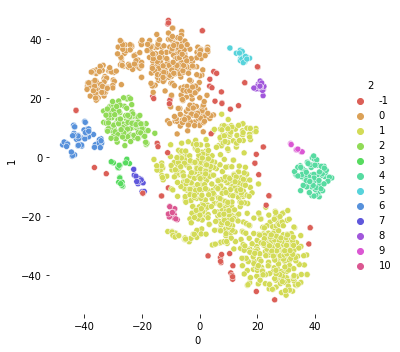

3.35 10.0 0.33524430997678684


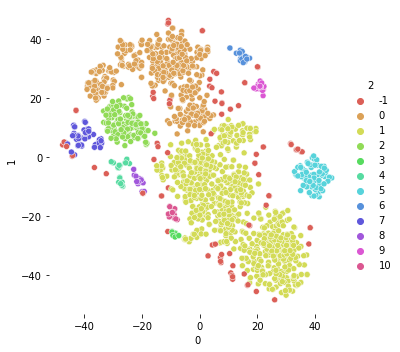

3.675 3.0 0.40923717562168976


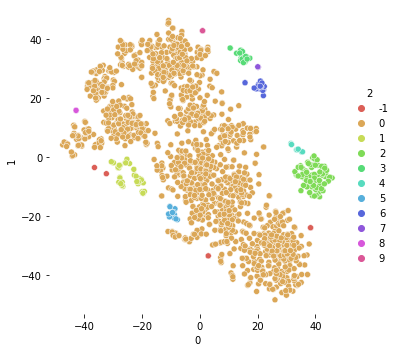

3.675 4.75 0.4236762414463497


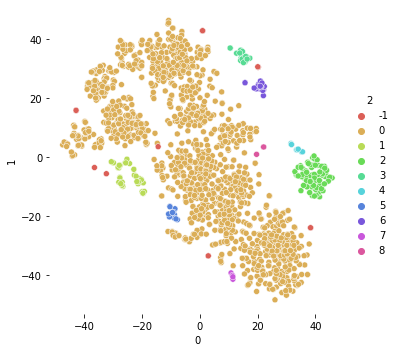

3.675 6.5 0.46473556235323754


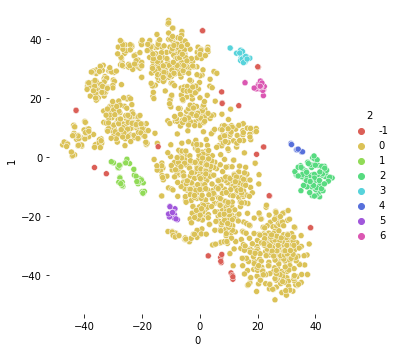

3.675 8.25 0.40638589032163613


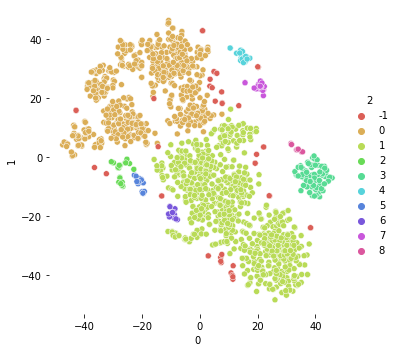

3.675 10.0 0.40240806361778525


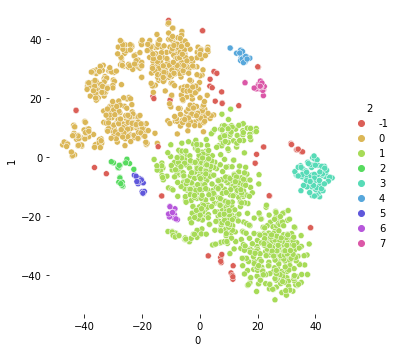

4.0 3.0 0.42709968451467983


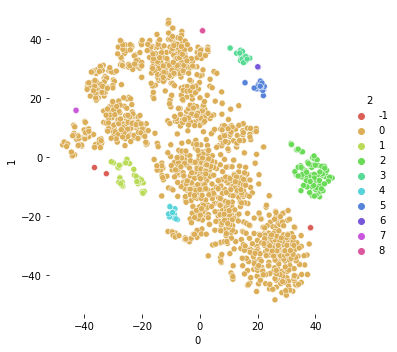

4.0 4.75 0.4710554540412497


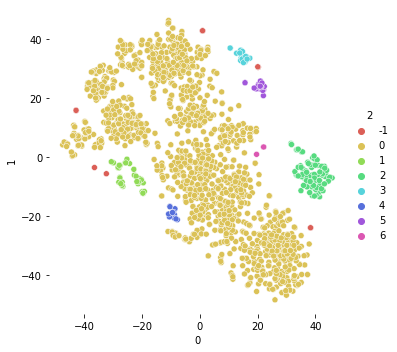

4.0 6.5 0.4991955334157434


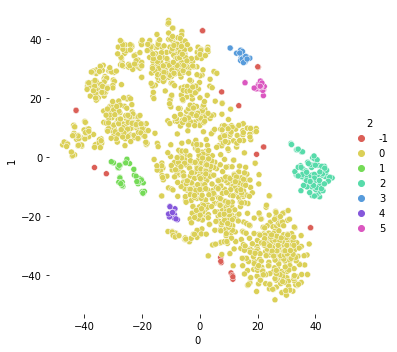

4.0 8.25 0.4420416411759652


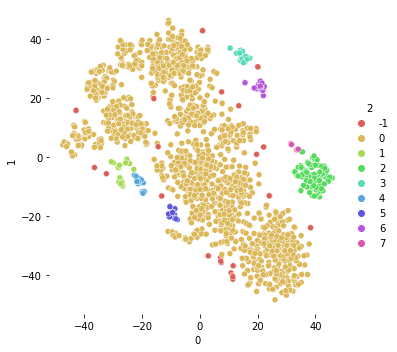

4.0 10.0 0.46031794355427336


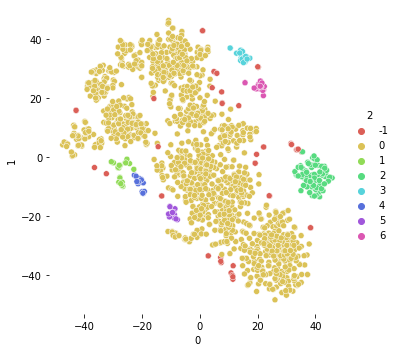

In [42]:
from sklearn import metrics
for eps in np.linspace(2.7, 4,5):
    for min_sam in np.linspace(3, 10, 5):
        label = dbscan_label(tsne_features, eps=eps, min_samples=min_sam)
        num_cluster = np.size(np.unique(label))
        labels_true = pd.cut(sp, bins=num_cluster, labels=np.arange(num_cluster))
        score = metrics.fowlkes_mallows_score(labels_true, label)
        print(eps, min_sam, score)
        plot_tsne_cluster(label)

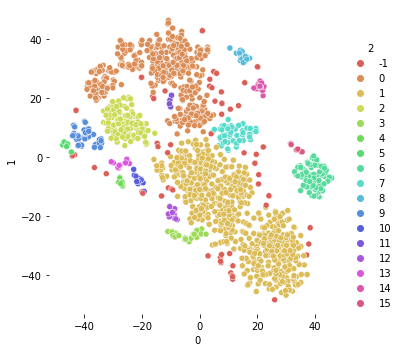

In [43]:
label = dbscan_label(tsne_features, eps=3, min_samples=6.5)
num_cluster = np.size(np.unique(label))
plot_tsne_cluster(label)

In [44]:
train.loc[label==7,:]

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
42,43,85,RL,9180,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,SFoyer,5,7,1983,1983,Gable,CompShg,HdBoard,HdBoard,None,0.0,3,3,CBlock,4.0,3.0,Av,ALQ,747,LwQ,93,0,840,GasA,4,Y,SBrkr,884,0,0,884,1,0,1,0,2,1,4,5,Typ,0,Attchd,1983.0,RFn,2,504,TA,Gd,Y,240,0,0,0,0,0,0,12,2007,WD,Normal,144000
186,187,80,RL,9947,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,Mitchel,Norm,Norm,1Fam,SLvl,7,5,1990,1991,Gable,CompShg,HdBoard,HdBoard,None,0.0,3,3,PConc,4.0,3.0,Av,GLQ,611,Unf,0,577,1188,GasA,5,Y,SBrkr,1217,0,0,1217,1,0,2,0,3,1,4,6,Typ,0,Attchd,1990.0,Unf,2,497,TA,TA,Y,168,27,0,0,0,0,0,6,2009,WD,Normal,173000
253,254,80,RL,9350,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,SLvl,6,7,1964,1991,Hip,CompShg,HdBoard,HdBoard,BrkFace,108.0,3,3,CBlock,4.0,3.0,Gd,LwQ,270,ALQ,580,452,1302,GasA,5,Y,SBrkr,1302,0,0,1302,0,1,2,0,3,1,4,7,Min1,0,Attchd,1964.0,RFn,1,309,TA,TA,Y,333,0,0,0,0,0,0,10,2007,CWD,Normal,158000
260,261,80,RL,19296,Pave,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Artery,Norm,1Fam,SLvl,6,5,1962,1962,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,399.0,3,3,CBlock,3.0,3.0,Gd,Rec,672,ALQ,690,0,1362,GasA,3,Y,SBrkr,1382,0,0,1382,1,0,1,0,3,1,3,6,Typ,1,Attchd,1991.0,Unf,2,884,TA,TA,Y,0,0,252,0,0,0,0,5,2009,WD,Normal,176000
262,263,80,RL,8471,Pave,IR1,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,SLvl,6,7,1977,1995,Gable,CompShg,HdBoard,Plywood,BrkFace,46.0,3,3,CBlock,4.0,4.0,Av,ALQ,506,Unf,0,0,506,GasA,3,Y,SBrkr,1212,0,0,1212,1,0,1,0,3,1,3,6,Typ,1,Attchd,1978.0,Unf,2,492,TA,TA,Y,292,12,0,0,0,0,0,7,2006,WD,Normal,151000
295,296,80,RL,7937,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,Mitchel,Norm,Norm,1Fam,SLvl,6,6,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,3,3,CBlock,3.0,3.0,Av,GLQ,819,Unf,0,184,1003,GasA,3,Y,SBrkr,1003,0,0,1003,1,0,1,0,3,1,3,6,Typ,0,Detchd,1984.0,Unf,2,588,TA,TA,Y,120,0,0,0,0,0,0,3,2006,WD,Normal,142500
319,320,80,RL,14115,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,SLvl,7,5,1980,1980,Gable,CompShg,Plywood,Plywood,BrkFace,225.0,3,3,CBlock,4.0,3.0,Av,GLQ,1036,Unf,0,336,1372,GasA,3,Y,SBrkr,1472,0,0,1472,1,0,2,0,3,1,3,6,Typ,2,Attchd,1980.0,Unf,2,588,TA,TA,Y,233,48,0,0,0,0,0,6,2009,WD,Normal,187500
358,359,80,RL,6930,Pave,IR1,Lvl,AllPub,Inside,Gtl,ClearCr,Norm,Norm,1Fam,SLvl,5,4,1958,1958,Hip,CompShg,Wd Sdng,ImStucc,BrkFace,120.0,3,3,CBlock,3.0,3.0,Av,BLQ,300,Rec,294,468,1062,GasA,5,Y,FuseF,1352,0,0,1352,0,1,1,0,3,1,4,6,Min2,0,BuiltIn,1958.0,Unf,1,288,TA,TA,Y,168,0,294,0,0,0,0,7,2006,WD,Abnorml,130000
360,361,85,RL,7540,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,6,6,1978,1978,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,3,CBlock,4.0,3.0,Av,GLQ,773,Unf,0,115,888,GasA,5,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,3,5,Typ,1,Attchd,1978.0,RFn,2,470,TA,TA,Y,0,0,0,0,192,0,0,6,2007,WD,Normal,156000
367,368,80,RL,9150,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,SLvl,6,5,1962,1962,Gable,Tar&Grv,Plywood,Plywood,BrkFace,305.0,3,3,CBlock,4.0,3.0,Gd,GLQ,371,Unf,0,728,1099,GasA,4,Y,SBrkr,1431,0,0,1431,0,1,1,0,3,1,3,6,Typ,1,Basment,1962.0,RFn,1,296,TA,TA,Y,64,110,0,0,0,0,0,12,2008,WD,Normal,165000


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

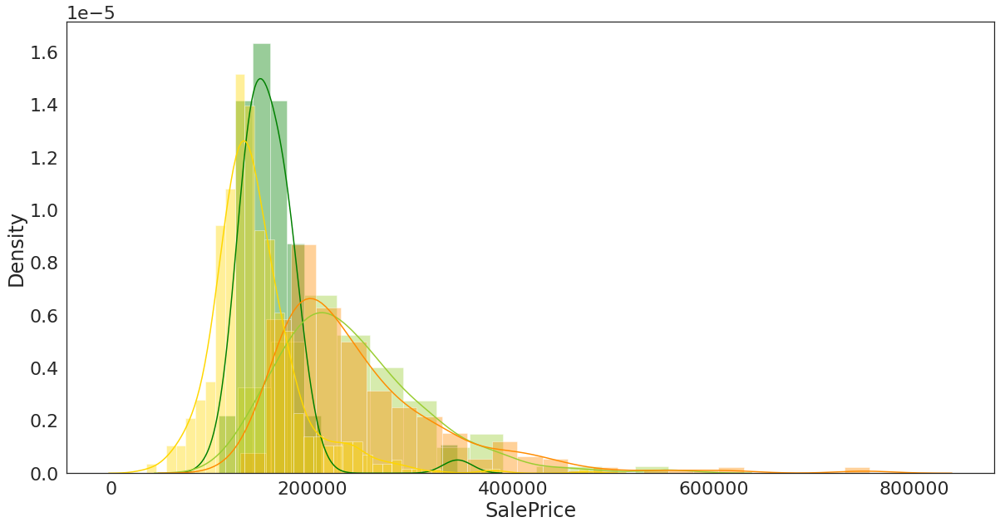

In [45]:
plt.figure(figsize=(20,10))
sns.set(font_scale=2)
sns.set_style("white")
sns.distplot(train.loc[label==7, 'SalePrice'], color="green")
sns.distplot(train.loc[label==2, 'SalePrice'], color="yellowgreen")
sns.distplot(train.loc[label==0, 'SalePrice'], color="darkorange")
sns.distplot(train.loc[label==1, 'SalePrice'], color="gold")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


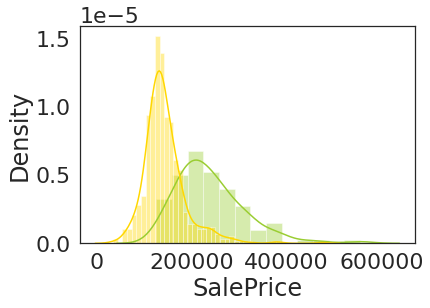

In [46]:
sns.distplot(train.loc[label==2, 'SalePrice'], color="yellowgreen")
sns.distplot(train.loc[label==1, 'SalePrice'], color="gold")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.00020472722267388493


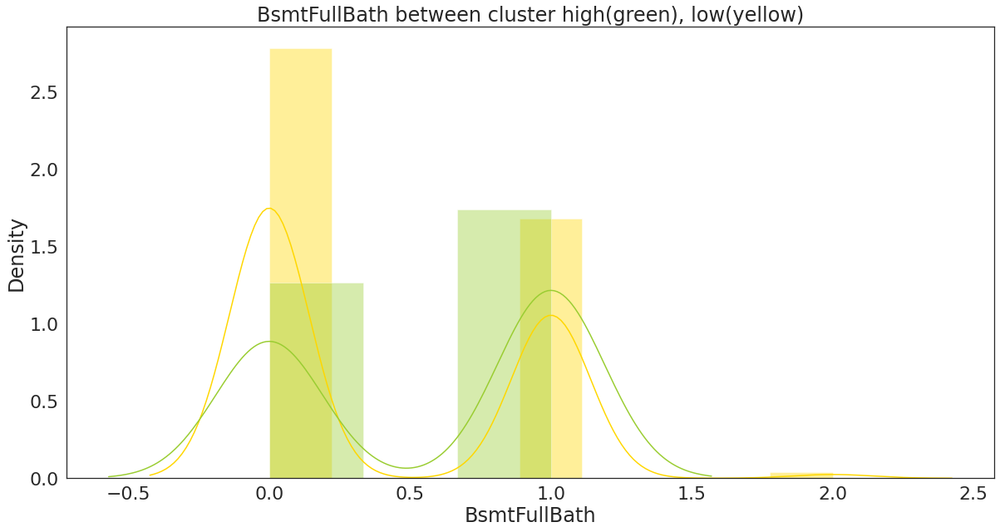

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


1.5554479121700558e-38


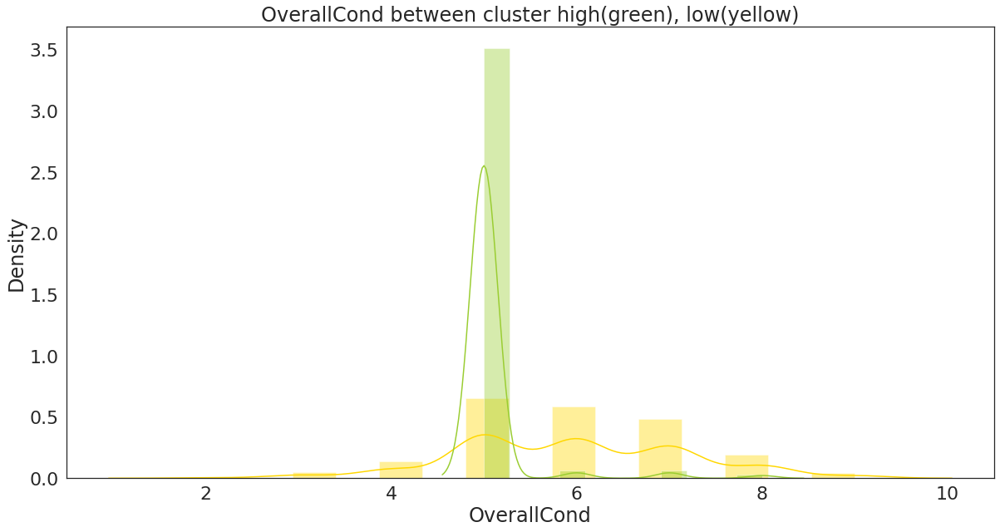

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.020635877134980014


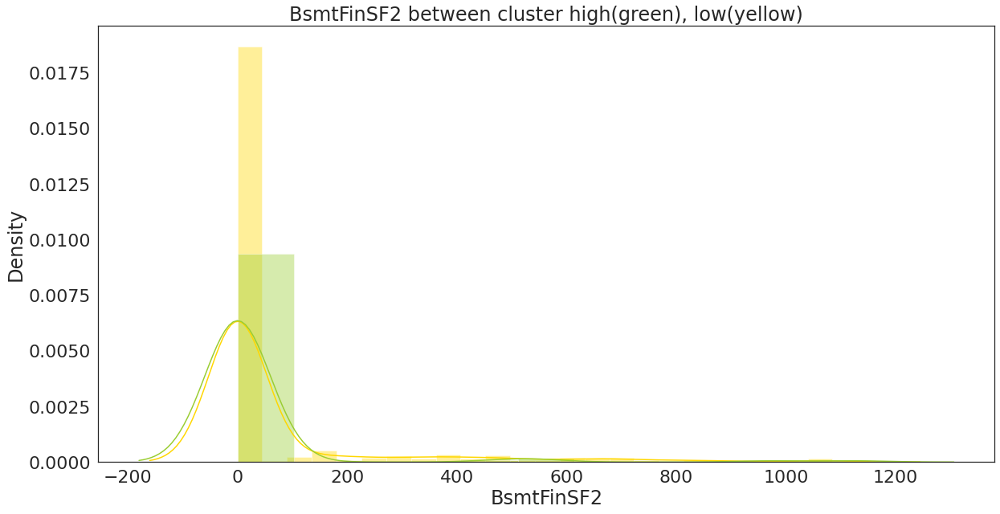

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.13943516367947056


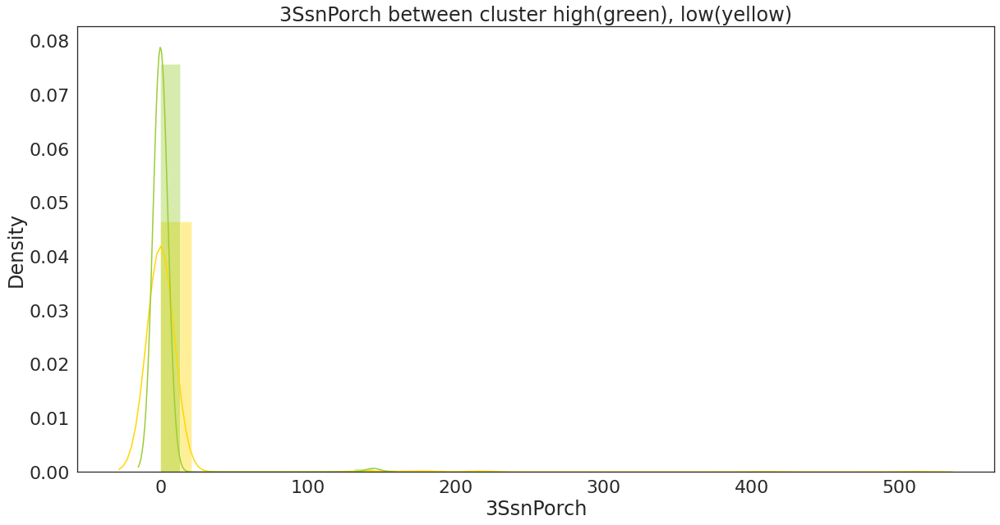

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


4.950194093563602e-35


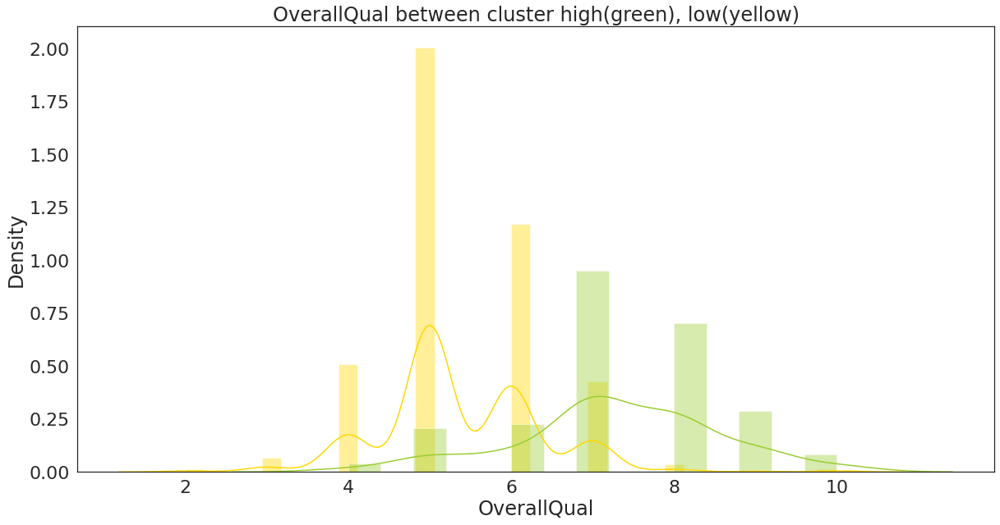

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


2.5069010965916126e-44


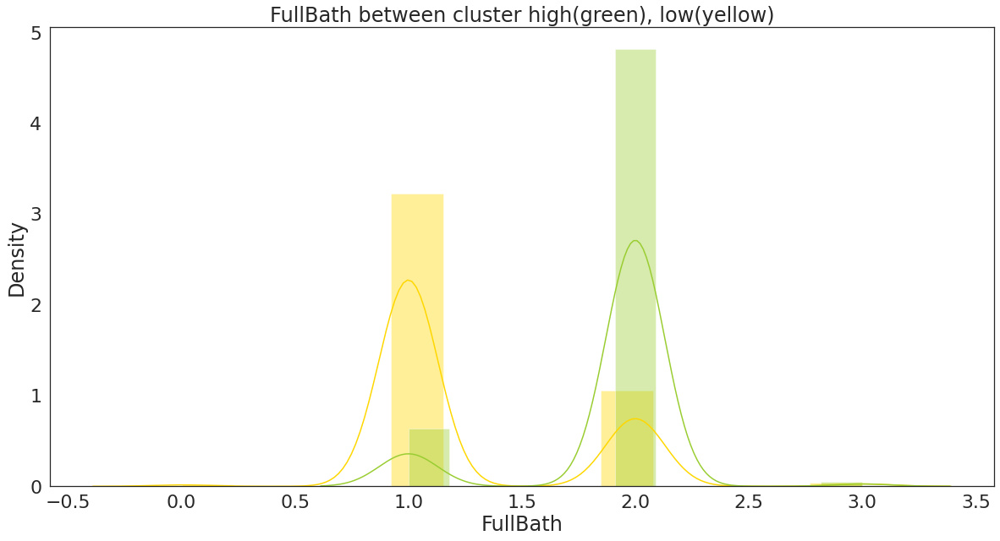

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


0.31772325097782794


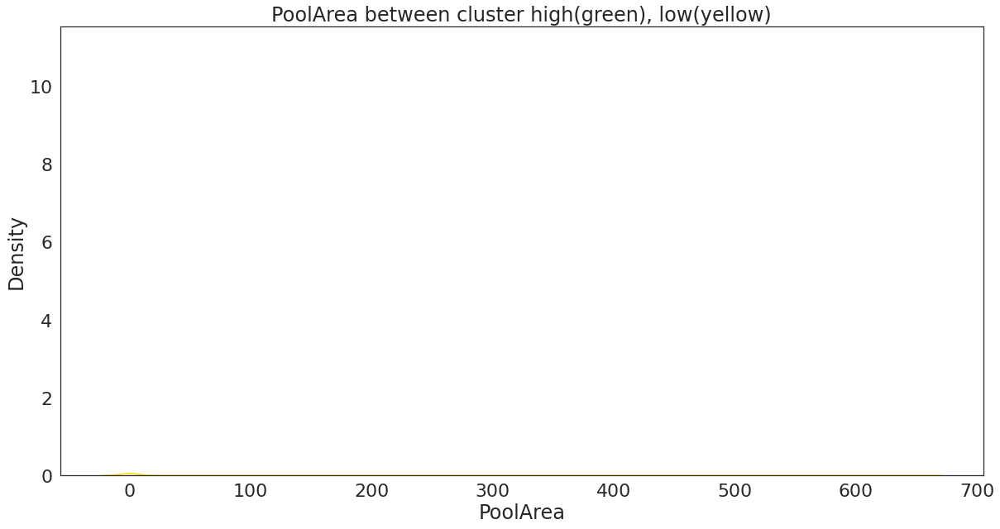

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


3.024001863850652e-05


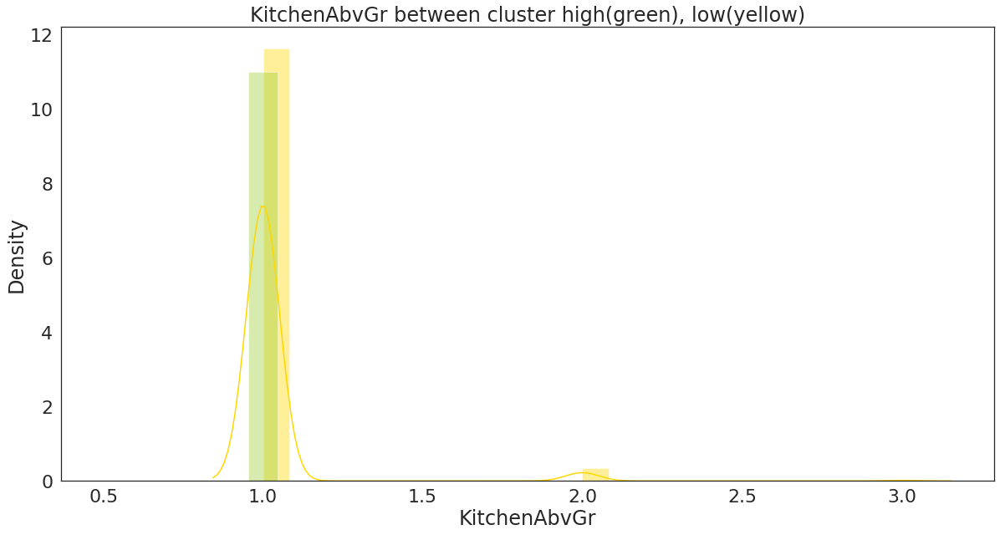

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


3.0445554917053054e-28


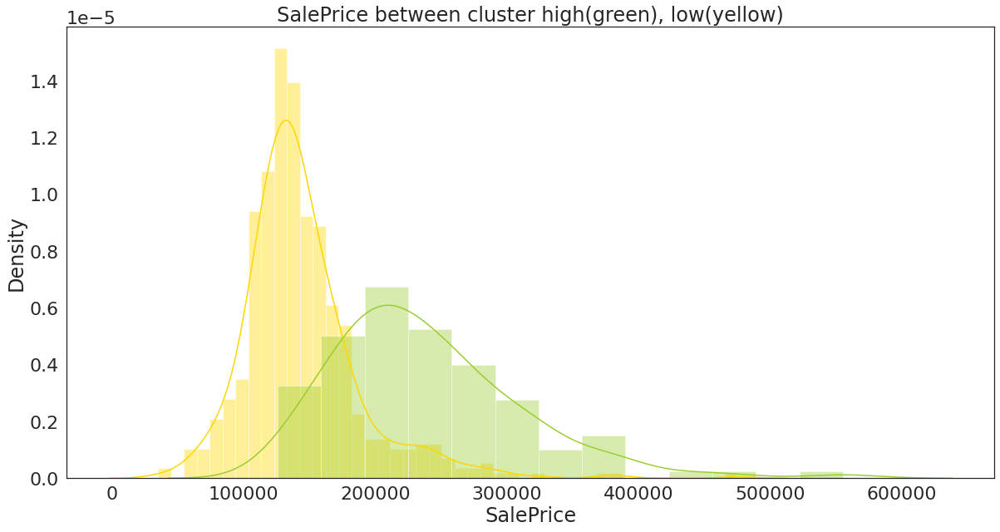

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


2.5970757473682215e-05


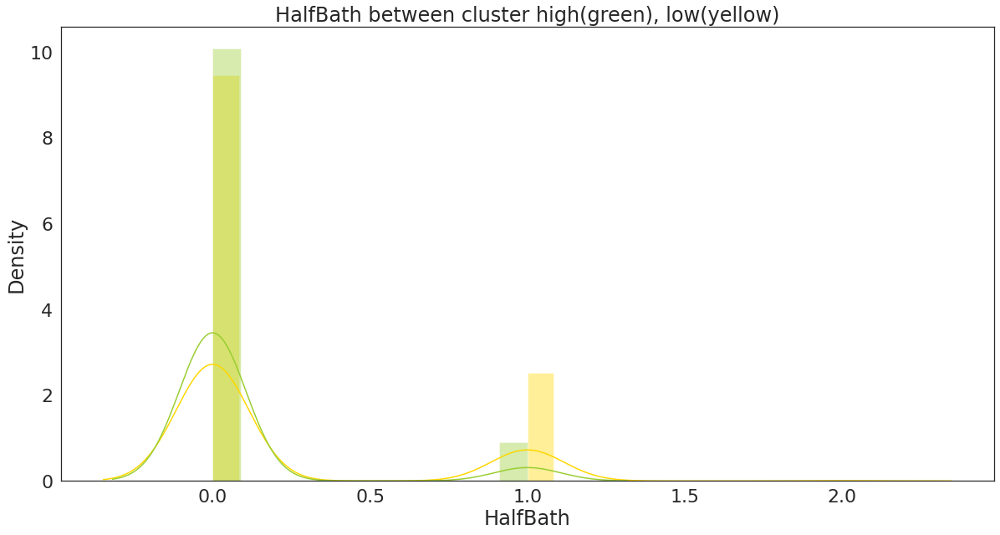

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


2.80787397345158e-05


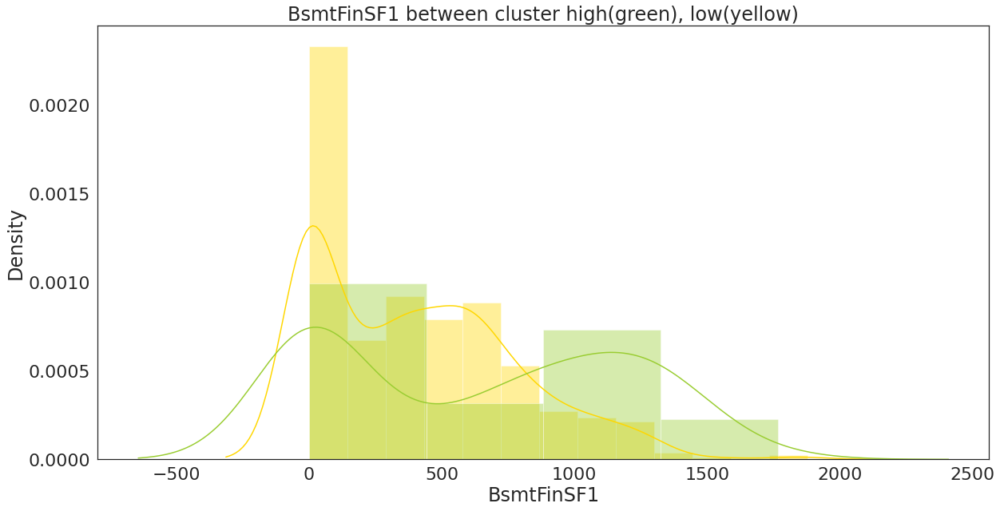

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.5759667419197995


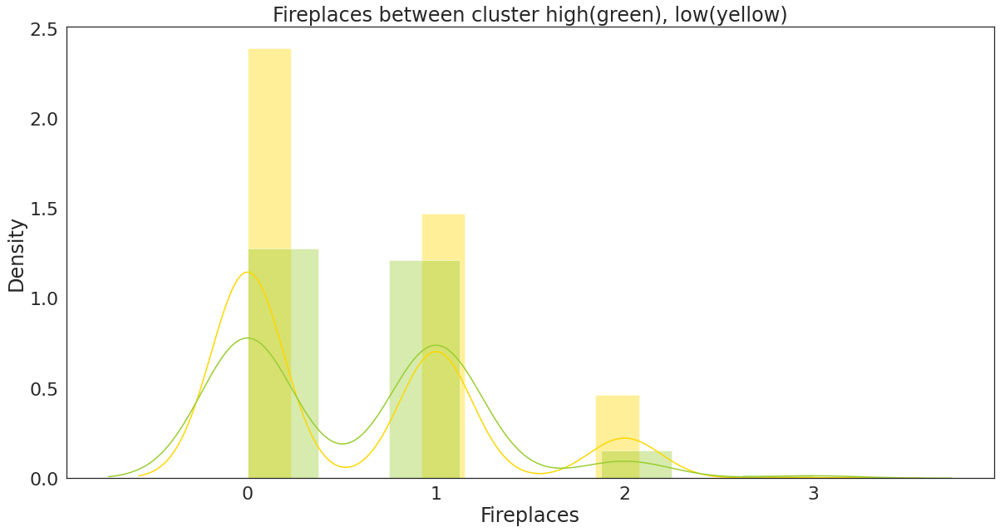

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


1.1730678198404808e-10


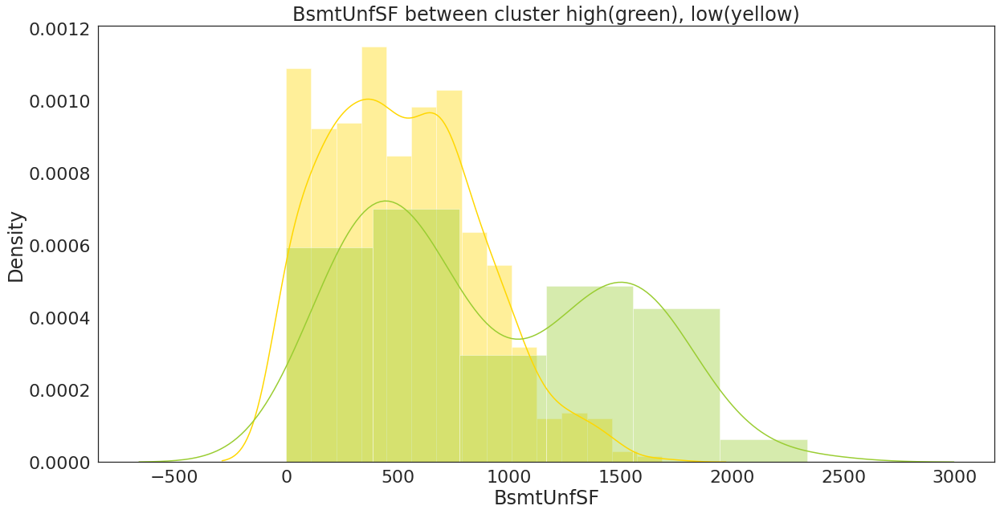

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


2.2373824155022133e-28


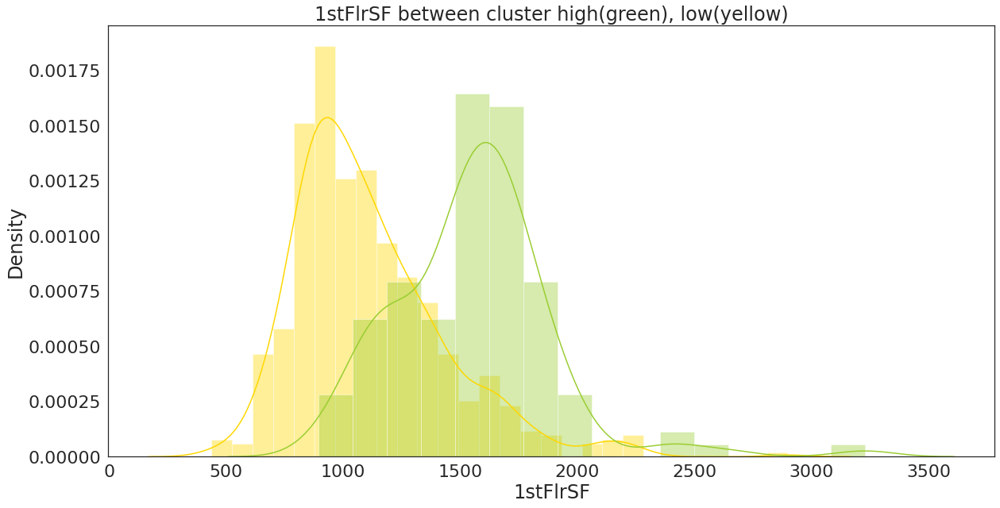

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.19445842353856066


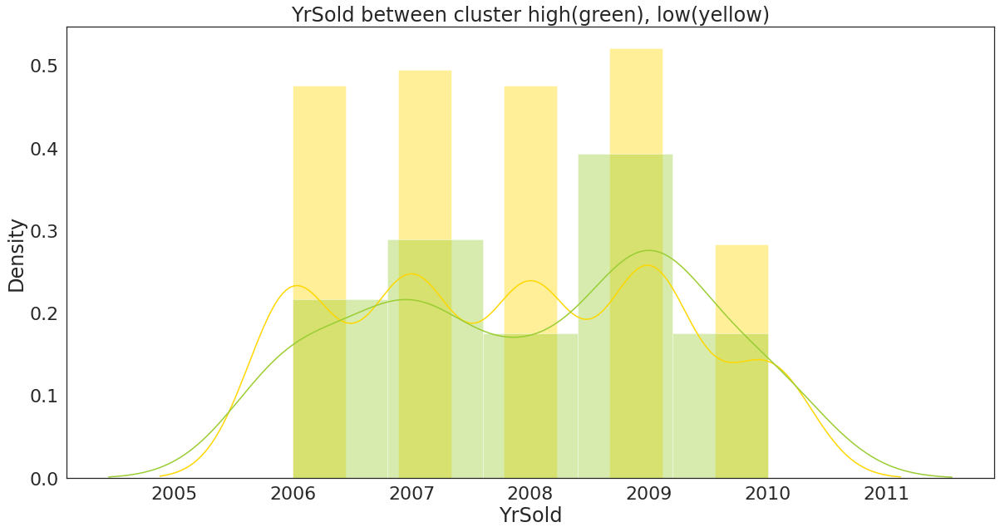

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


2.6002253159808616e-32


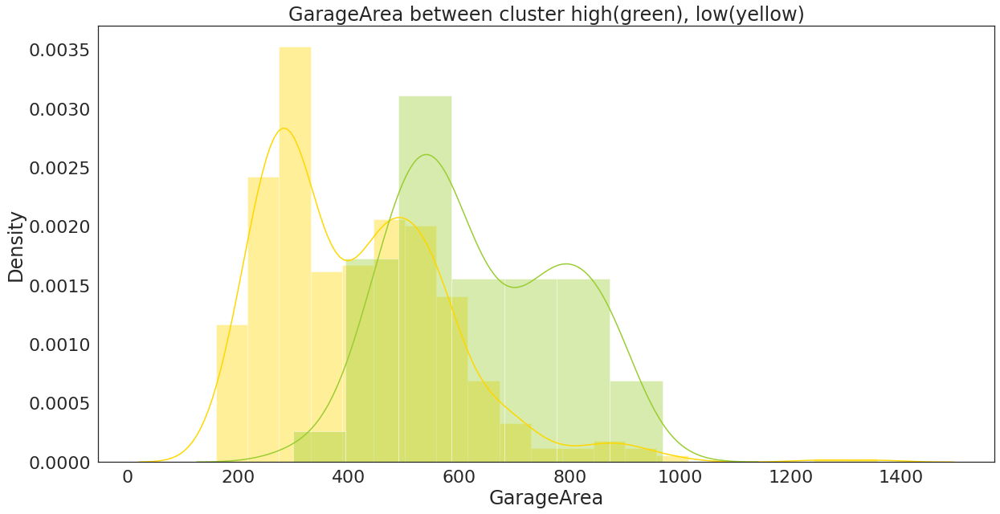

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.17859209423051767


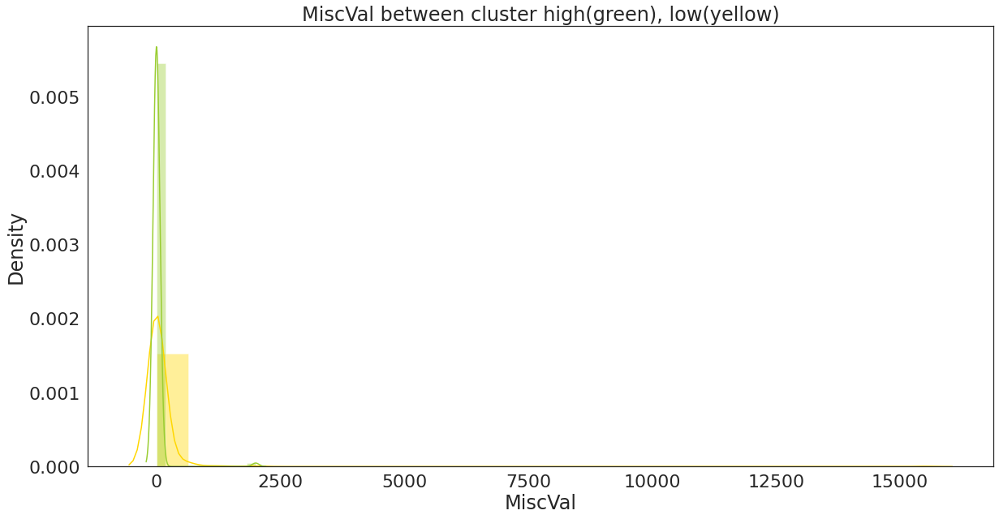

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.6918860112926696


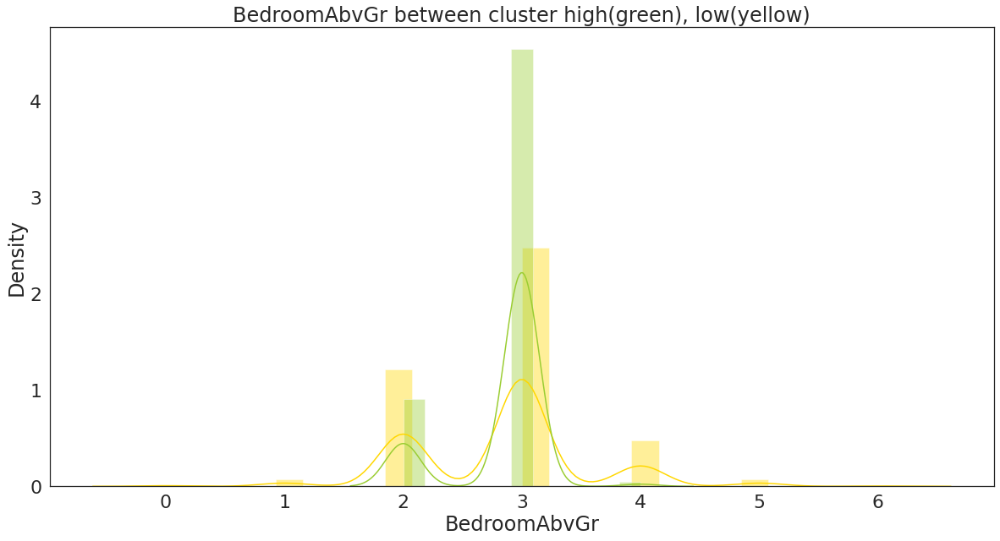

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.6848325987264591


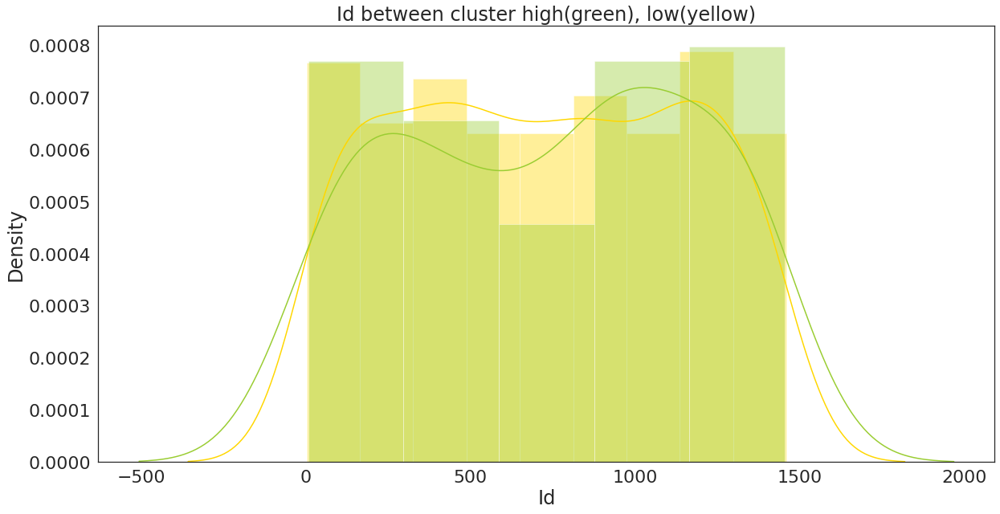

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


2.167136523335901e-06


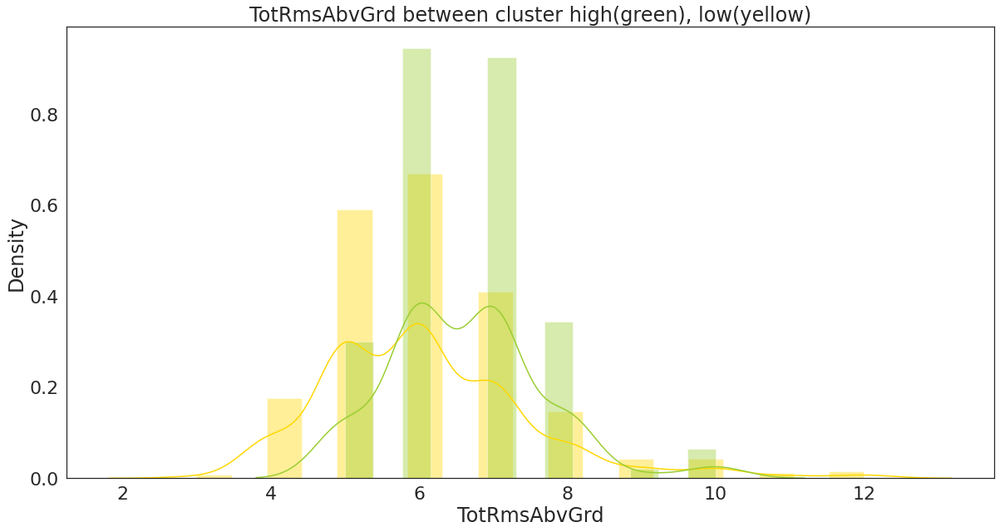

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


9.101496291859357e-08


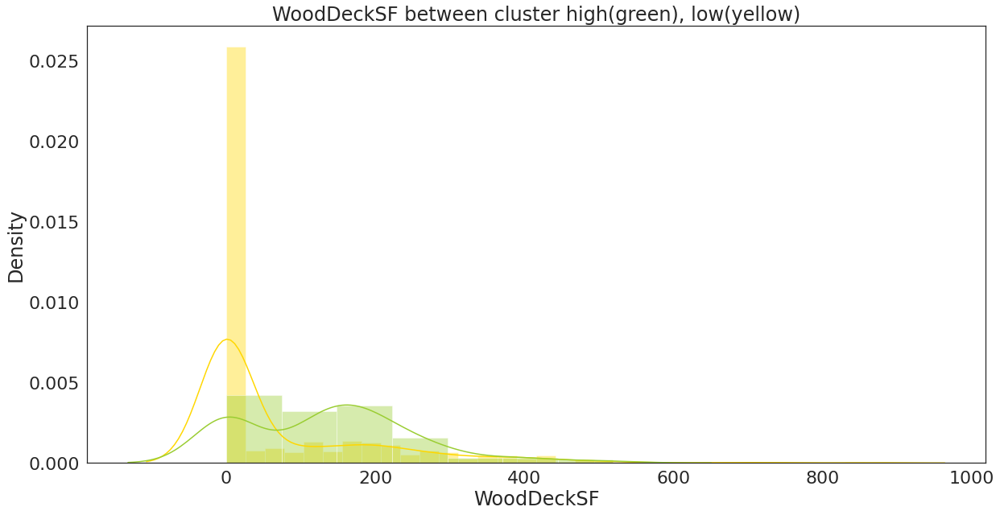

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


nan


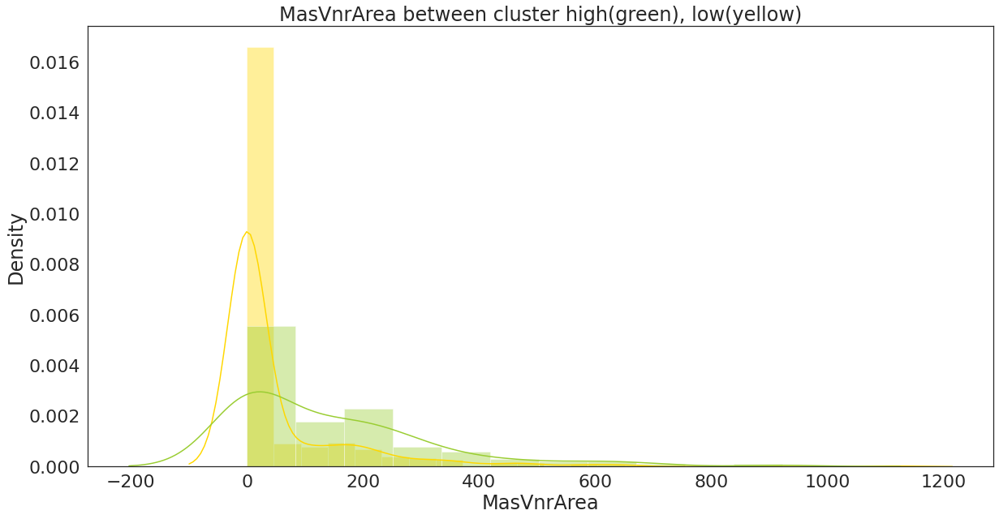

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


5.187181276191119e-186


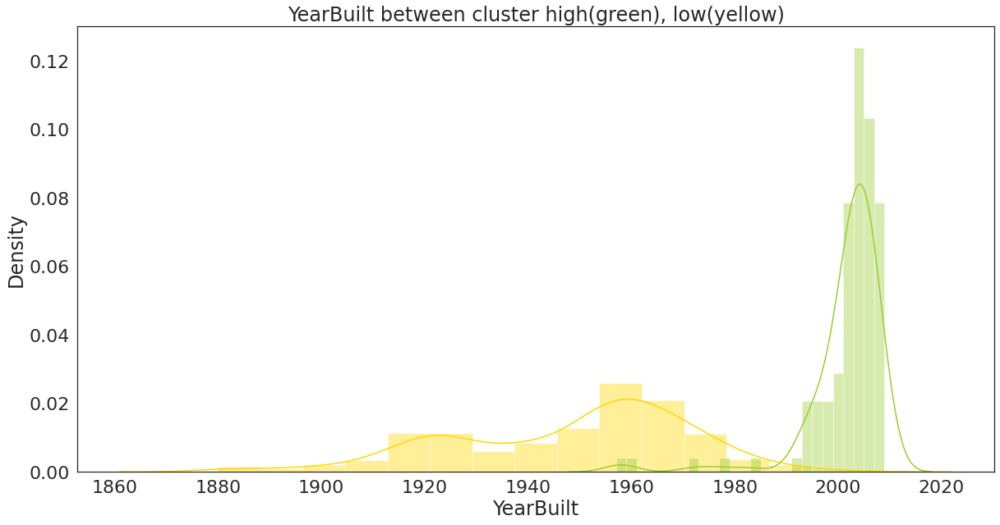

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


6.5526375912672145e-37


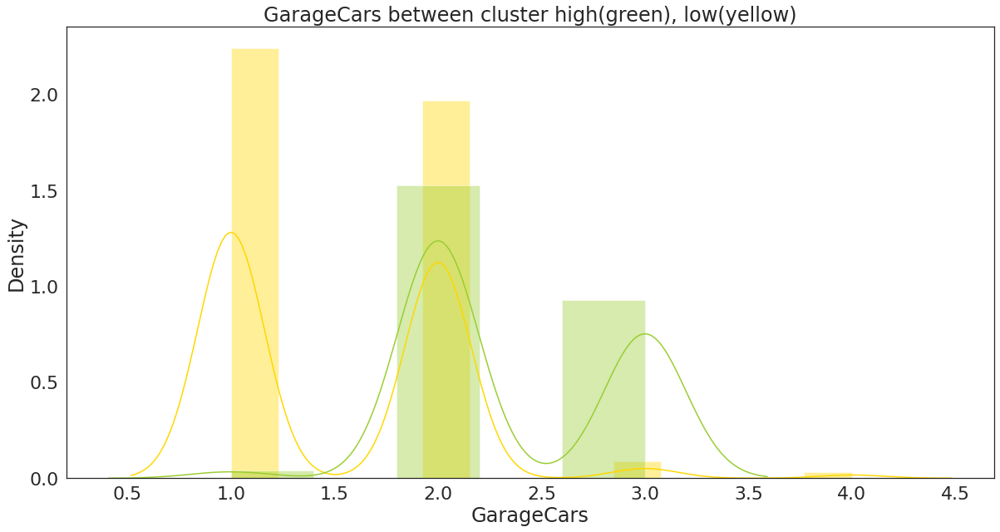

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.45533116370881743


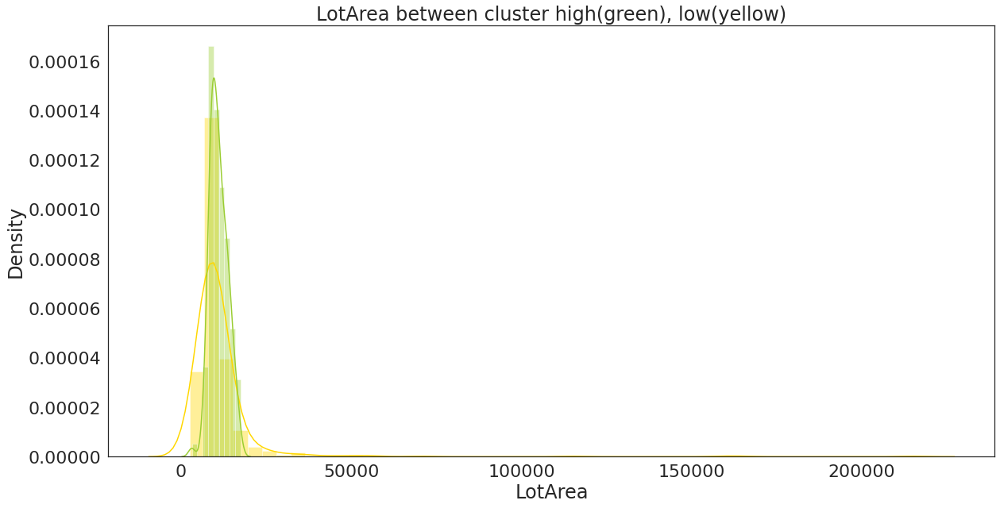

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


8.222148702138175e-10


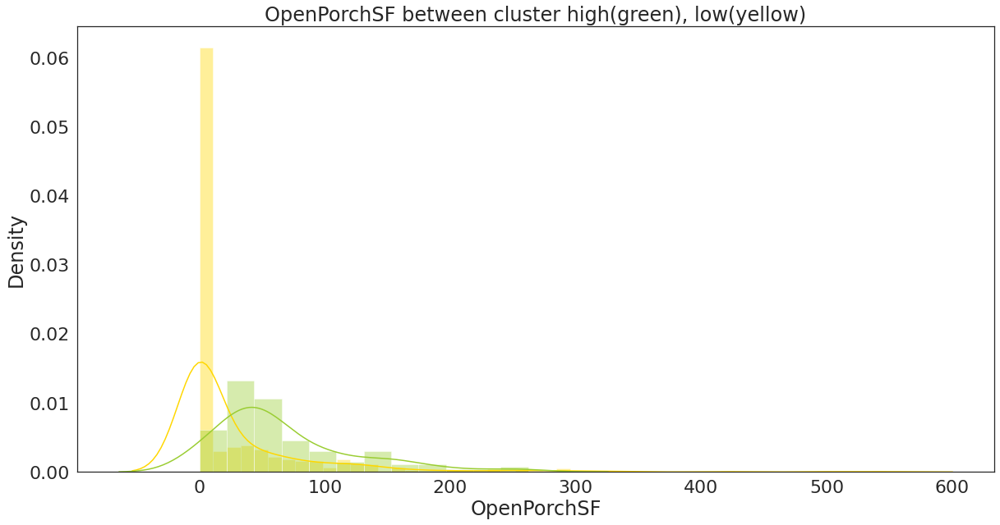

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


1.137766989022346e-130


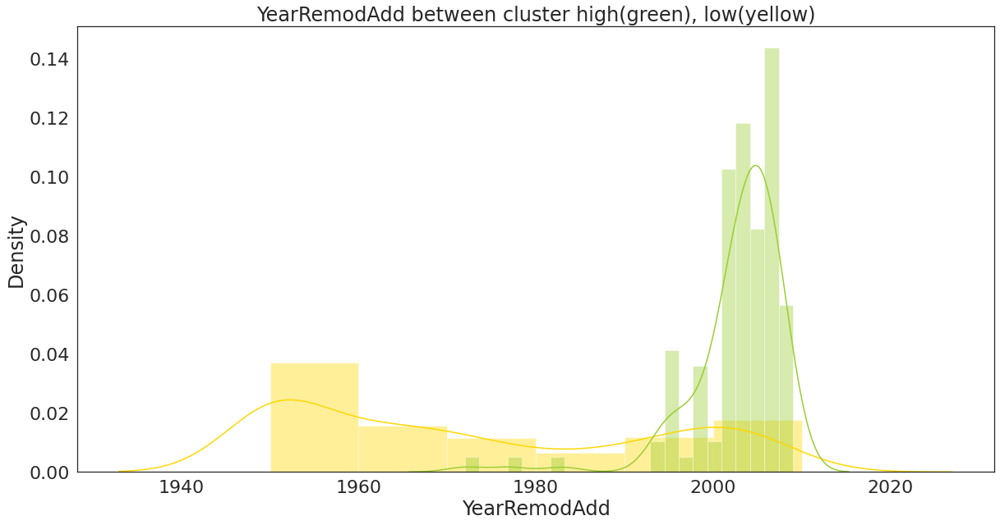

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.018235127247257395


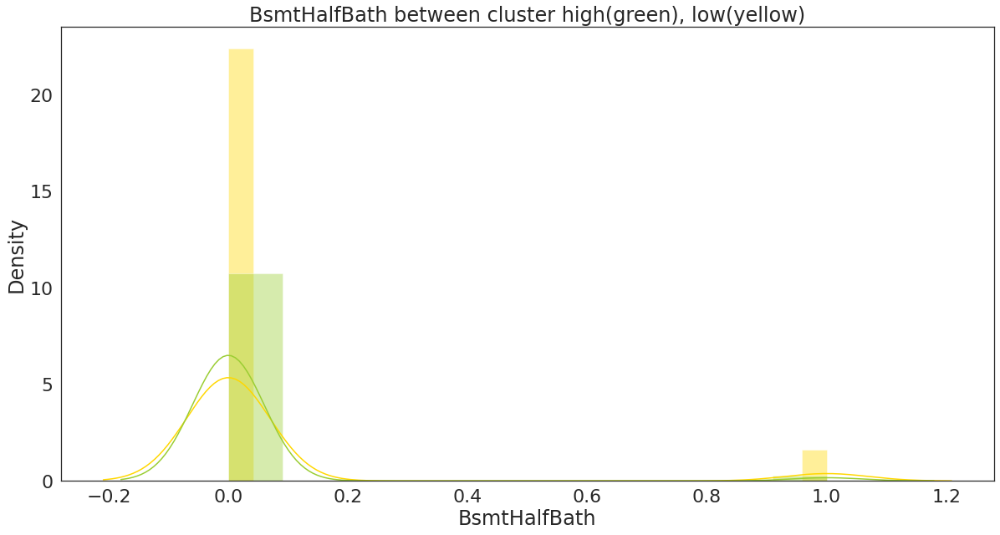

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


0.0007917274478668764


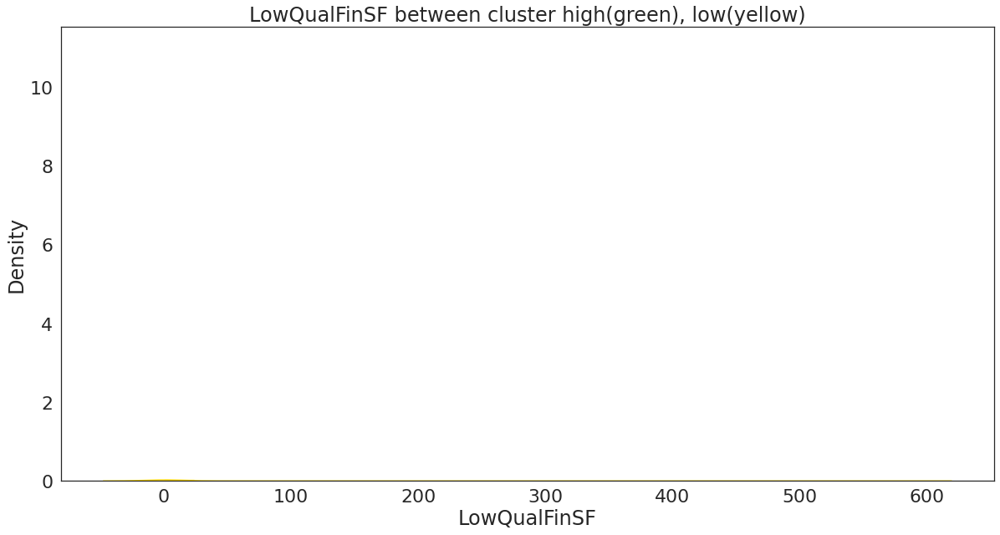

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


2.023129065815607e-09


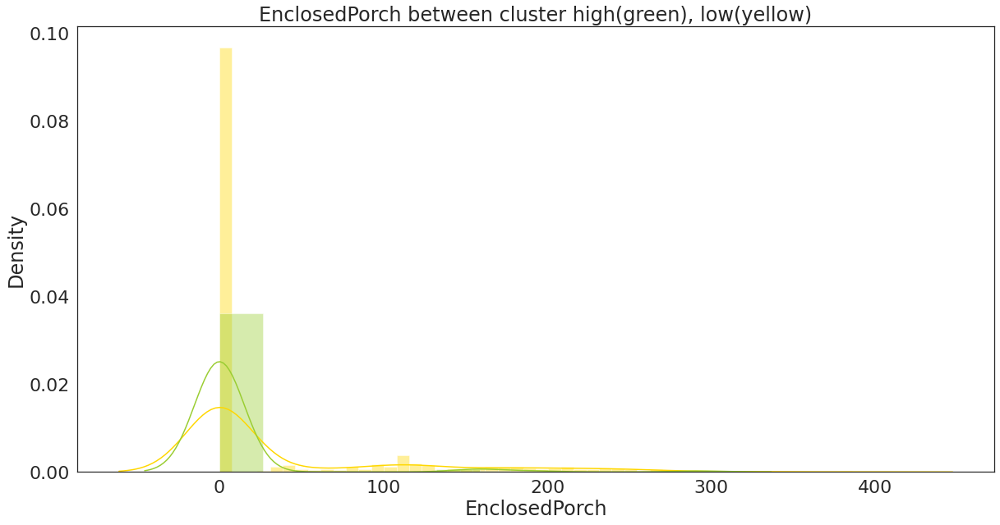

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.5409386372021456


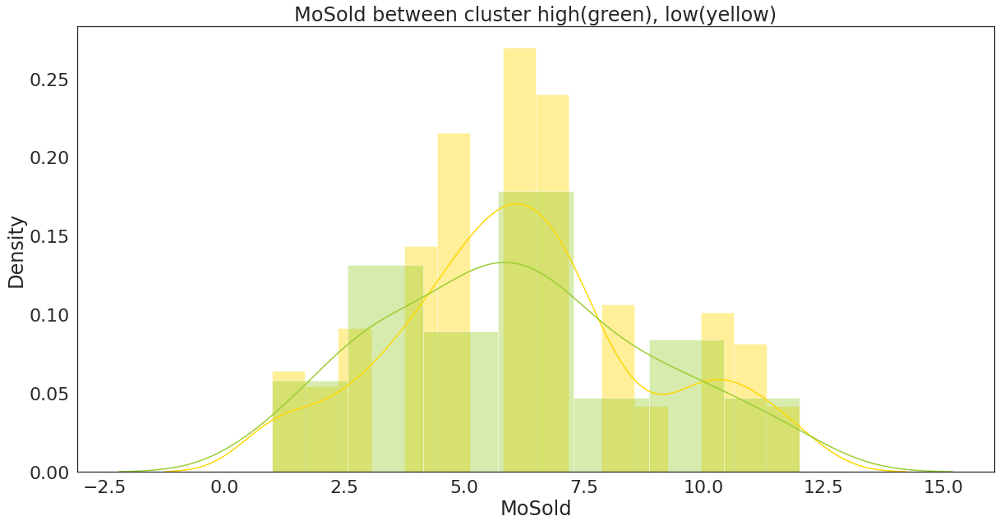

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


0.0005471627487933831


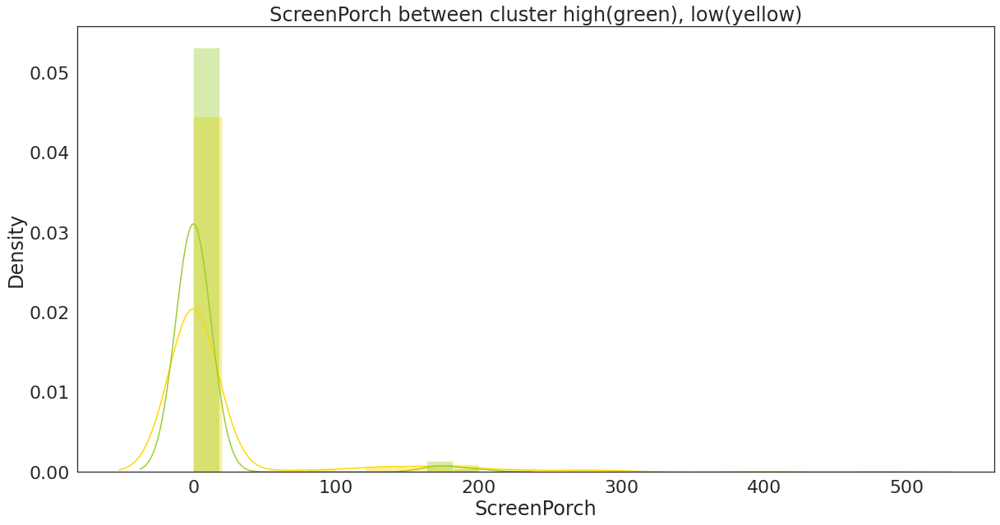

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


5.438065142783795e-33


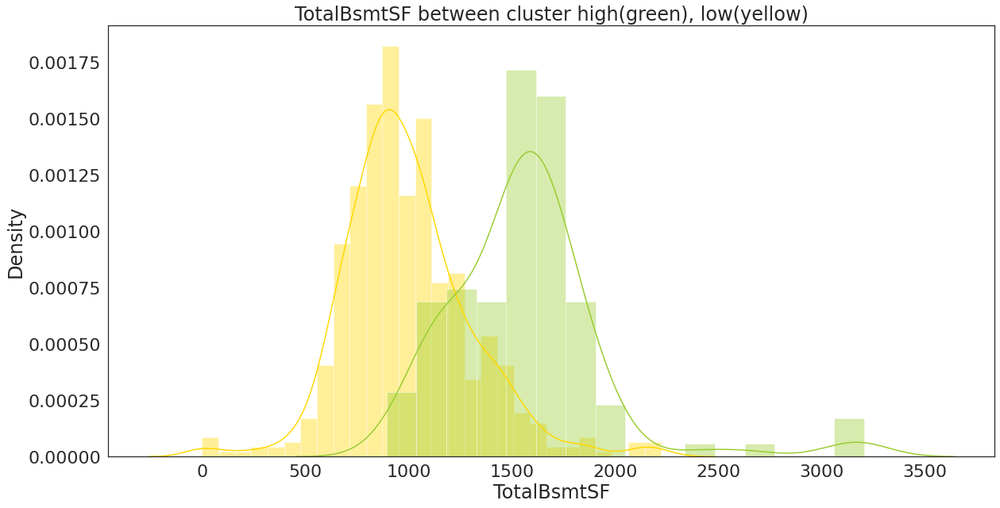

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


1.0845015707224821e-149


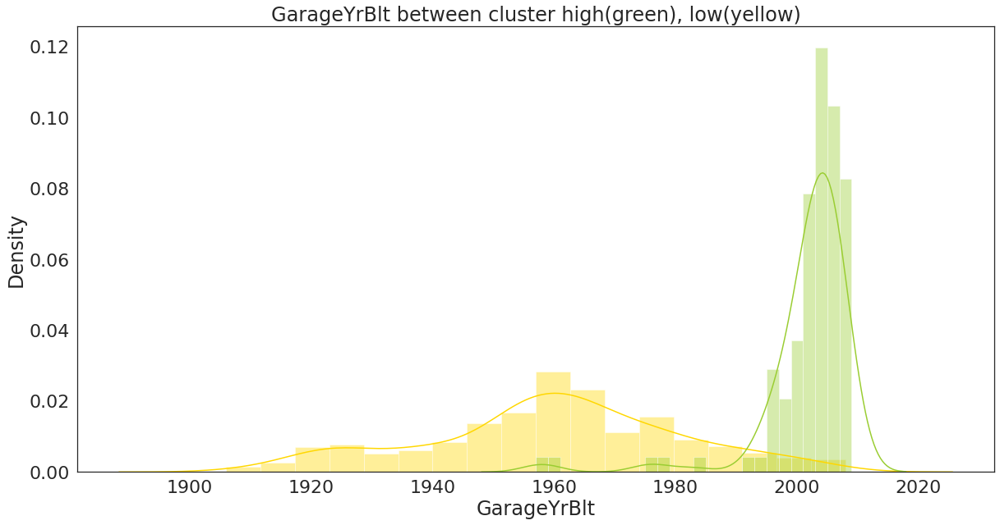

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


2.1564739786690856e-45


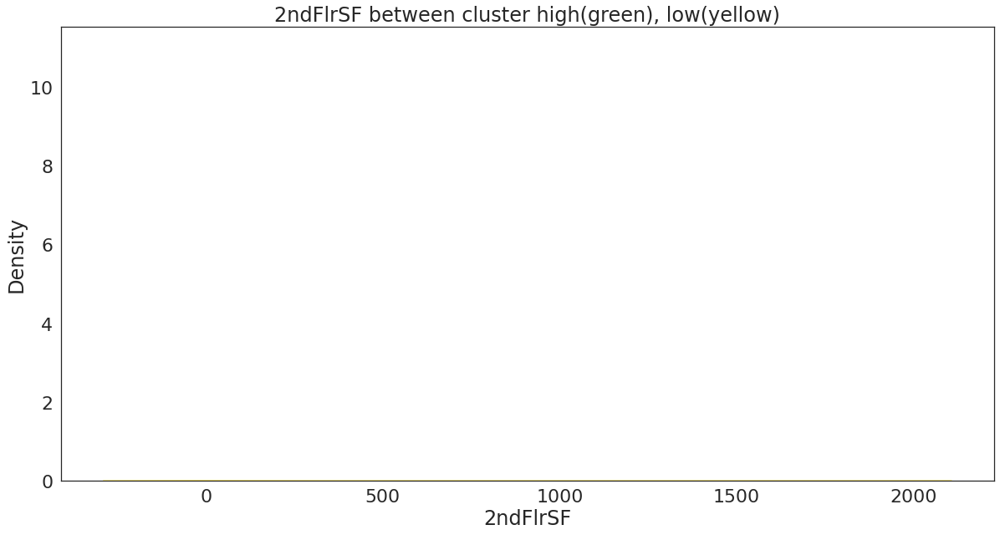

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


4.389448262565671e-09


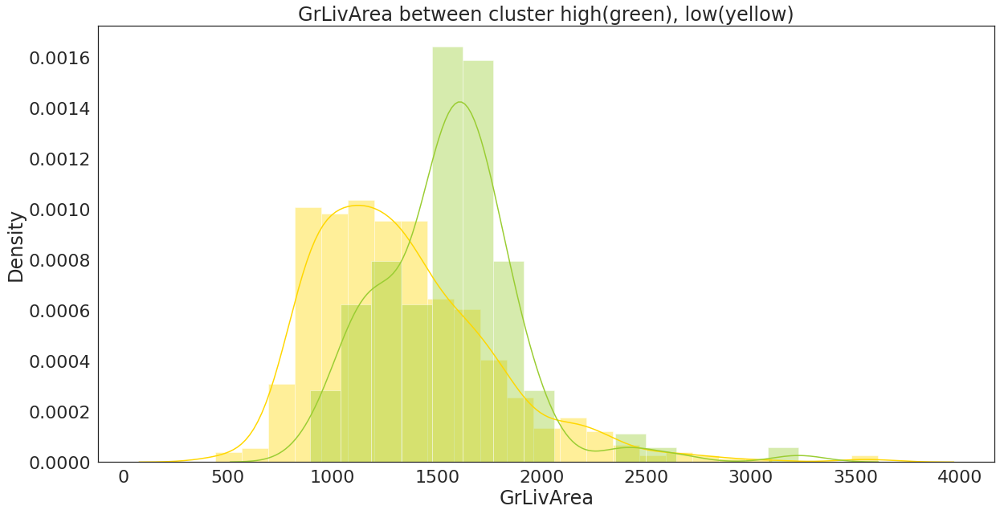

In [62]:
from scipy import stats

for cont in cont_attr:
    plt.figure(figsize=(20,10))
    sns.distplot(train.loc[label==1, cont], color="gold")
    sns.distplot(train.loc[label==2, cont], color="yellowgreen")
    print(stats.ttest_ind(train.loc[label==1, cont], train.loc[label==2, cont], equal_var = False)[1])
    plt.title(f"{cont} between cluster high(green), low(yellow)")
    plt.show()

In [63]:
from scipy import stats
pvals = []
for cont in cont_attr:
    print(f"   {cont} between cluster high(green), low(yellow)")
    p = stats.ttest_ind(train.loc[label==1, cont], train.loc[label==2, cont], equal_var = False)[1]
    pvals.append(p)
    print(p)


   BsmtFullBath between cluster high(green), low(yellow)
0.00020472722267388493
   OverallCond between cluster high(green), low(yellow)
1.5554479121700558e-38
   BsmtFinSF2 between cluster high(green), low(yellow)
0.020635877134980014
   3SsnPorch between cluster high(green), low(yellow)
0.13943516367947056
   OverallQual between cluster high(green), low(yellow)
4.950194093563602e-35
   FullBath between cluster high(green), low(yellow)
2.5069010965916126e-44
   PoolArea between cluster high(green), low(yellow)
0.31772325097782794
   KitchenAbvGr between cluster high(green), low(yellow)
3.024001863850652e-05
   SalePrice between cluster high(green), low(yellow)
3.0445554917053054e-28
   HalfBath between cluster high(green), low(yellow)
2.5970757473682215e-05
   BsmtFinSF1 between cluster high(green), low(yellow)
2.80787397345158e-05
   Fireplaces between cluster high(green), low(yellow)
0.5759667419197995
   BsmtUnfSF between cluster high(green), low(yellow)
1.1730678198404808e-10
   1s

In [81]:
cont_attr

{'1stFlrSF',
 '2ndFlrSF',
 '3SsnPorch',
 'BedroomAbvGr',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtFullBath',
 'BsmtHalfBath',
 'BsmtUnfSF',
 'EnclosedPorch',
 'Fireplaces',
 'FullBath',
 'GarageArea',
 'GarageCars',
 'GarageYrBlt',
 'GrLivArea',
 'HalfBath',
 'Id',
 'KitchenAbvGr',
 'LotArea',
 'LowQualFinSF',
 'MasVnrArea',
 'MiscVal',
 'MoSold',
 'OpenPorchSF',
 'OverallCond',
 'OverallQual',
 'PoolArea',
 'SalePrice',
 'ScreenPorch',
 'TotRmsAbvGrd',
 'TotalBsmtSF',
 'WoodDeckSF',
 'YearBuilt',
 'YearRemodAdd',
 'YrSold'}

In [78]:
from statsmodels.stats import multitest
multiple_test_result = multitest.multipletests(pvals)

In [88]:
pvalues = pd.DataFrame(multiple_test_result[1]).loc[multiple_test_result[0]]
pvalues.columns = ['p_value']

In [95]:
d = pd.DataFrame(cont_attr, columns=['attribute']).loc[multiple_test_result[0],:].join(pvalues).sort_values('p_value').reset_index(drop=True)

In [97]:
d.to_csv("pvalues.csv")

In [96]:
print(d)

        attribute        p_value
0       YearBuilt  1.867385e-184
1     GarageYrBlt  3.795755e-148
2    YearRemodAdd  3.868408e-129
3        2ndFlrSF   7.116364e-44
4        FullBath   8.022084e-43
5     OverallCond   4.821889e-37
6      GarageCars   1.965791e-35
7     OverallQual   1.435556e-33
8     TotalBsmtSF   1.522658e-31
9      GarageArea   7.020608e-31
10       1stFlrSF   5.817194e-27
11      SalePrice   7.611389e-27
12      BsmtUnfSF   2.815363e-09
13    OpenPorchSF   1.891094e-08
14  EnclosedPorch   4.450884e-08
15      GrLivArea   9.217841e-08
16     WoodDeckSF   1.820298e-06
17   TotRmsAbvGrd   4.117479e-05
18       HalfBath   4.673705e-04
19     BsmtFinSF1   4.772314e-04
20   KitchenAbvGr   4.837306e-04
21   BsmtFullBath   3.066511e-03
22    ScreenPorch   7.633094e-03
23   LowQualFinSF   1.024371e-02


In [73]:
import statsmodels
statsmodels.__version__
#!pip install update statsmodels==0.13.2

'0.10.2'

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


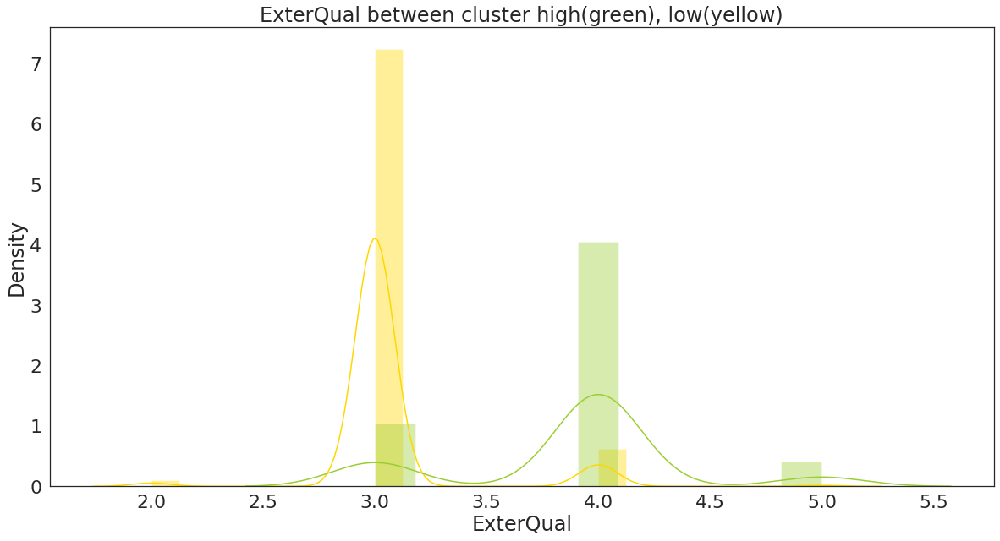

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


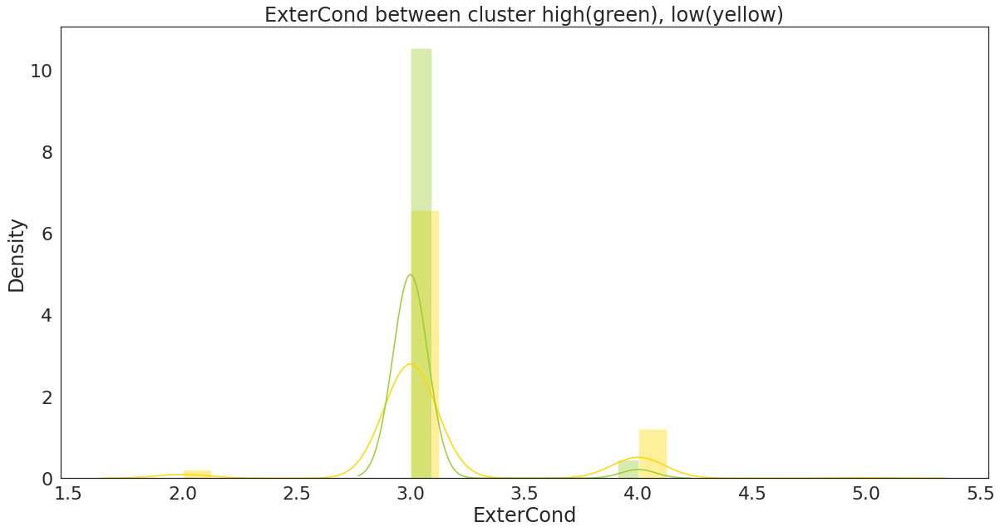

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


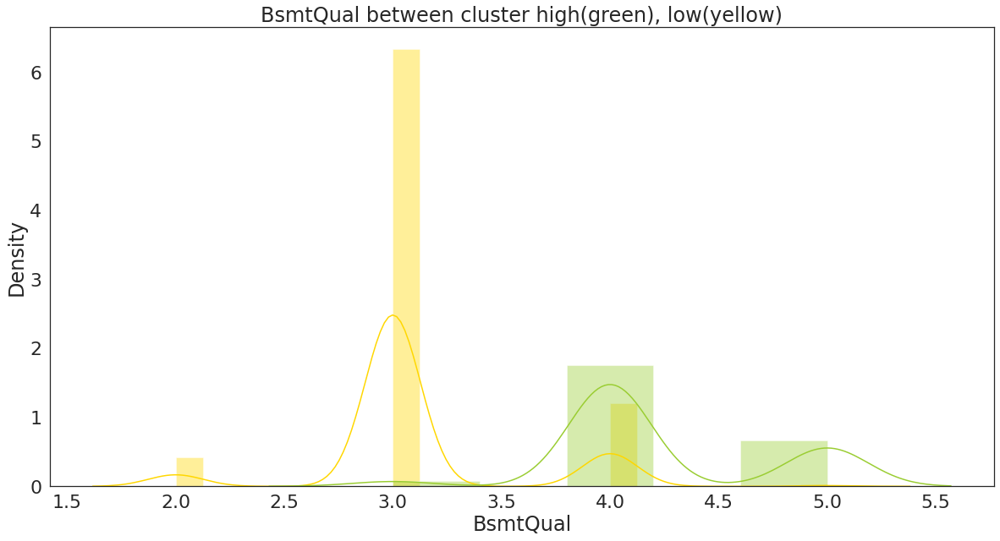

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


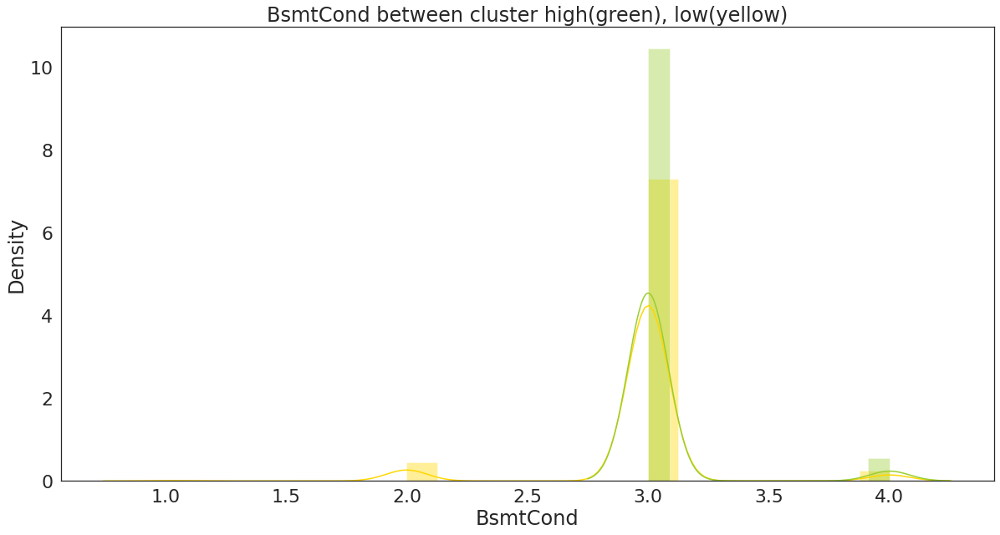

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


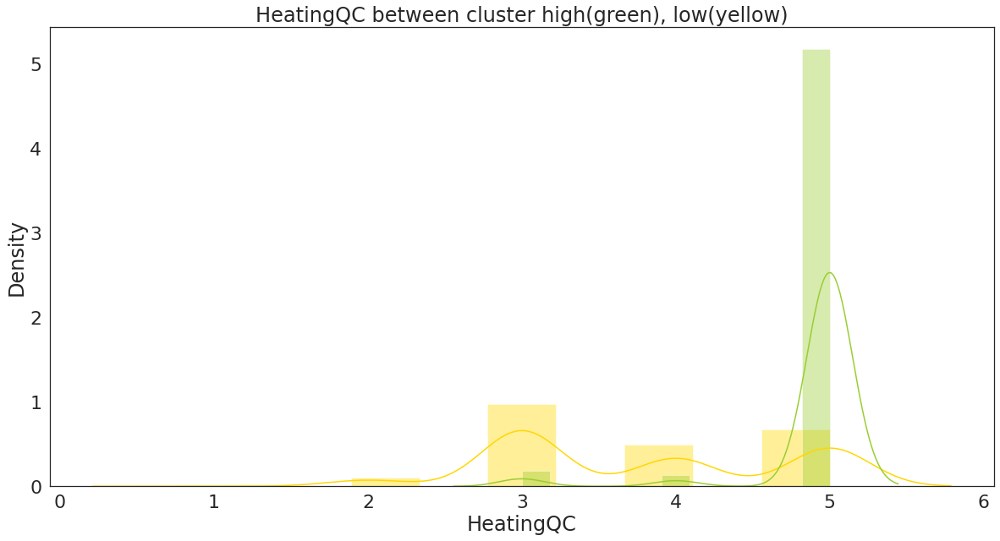

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


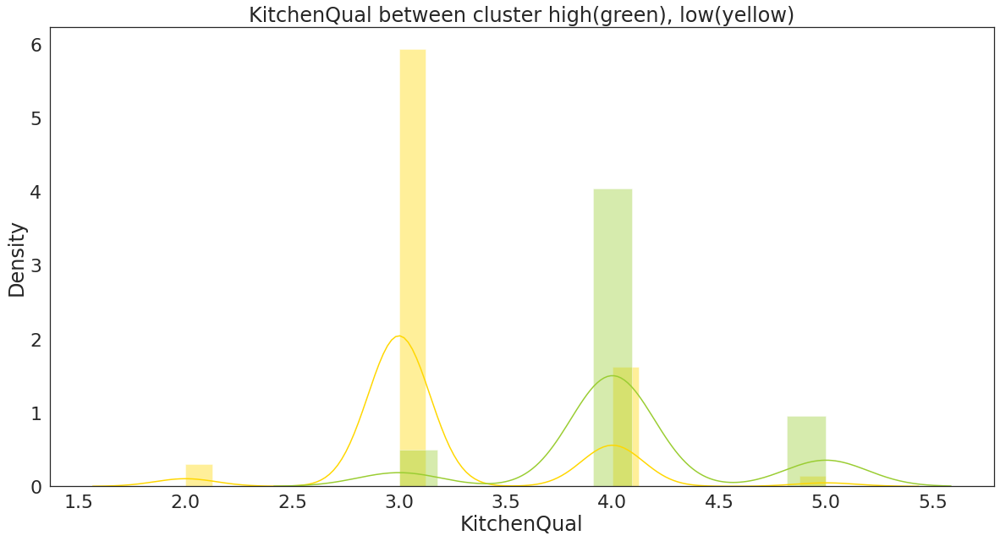

In [48]:
for cont in attr_scale_mapped:
    plt.figure(figsize=(20,10))
    sns.distplot(train.loc[label==1, cont], color="gold")
    sns.distplot(train.loc[label==2, cont], color="yellowgreen")
    plt.title(f"{cont} between cluster high(green), low(yellow)")
    plt.show()

In [54]:
print(train.loc[label==1, 'SalePrice'].describe(),train.loc[label==2, 'SalePrice'].describe())

count       587.000000
mean     144178.451448
std       45001.054101
min       35311.000000
25%      119000.000000
50%      137000.000000
75%      160000.000000
max      475000.000000
Name: SalePrice, dtype: float64 count       121.000000
mean     239149.214876
std       72089.161590
min      126000.000000
25%      189000.000000
50%      226000.000000
75%      272000.000000
max      555000.000000
Name: SalePrice, dtype: float64


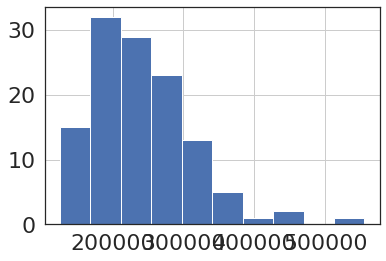

In [49]:
train.loc[label==2,'SalePrice'].hist()

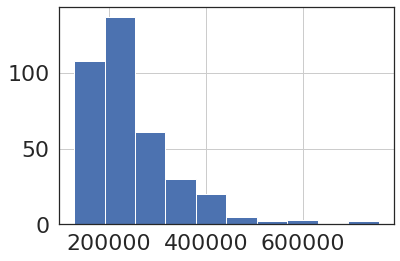

In [50]:
train.loc[label==0,'SalePrice'].hist()